# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

#data_dir = '../data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:11<00:00, 5.21KFile/s]


Extracting celeba...


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

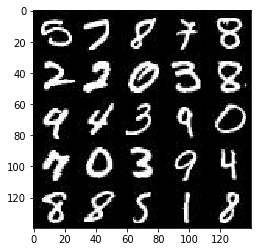

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

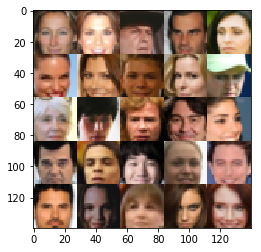

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_images = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="inputs_image")
    z_data = tf.placeholder(tf.float32, (None, z_dim), name="z_data")
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    

    return input_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope("discriminator",  reuse = reuse):
        # The original image is 28*28*3
        conv1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding='same')
        conv1 = tf.layers.batch_normalization(conv1, training=True)
        conv1 = tf.maximum(0.2* conv1, conv1)
        
        # Now the image is 14 *14 * 64
        conv2 = tf.layers.conv2d(conv1, 128, 5, strides=2, padding='same')
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.maximum(0.2*conv2, conv2)
        
        # Now the image is 7 * 7 * 128
        conv3 = tf.layers.conv2d(conv2, 256, 5, strides=2, padding='same')
        conv3 = tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.maximum(0.2*conv3, conv3)
        
       # Now the image is 4*4*256
        flat = tf.reshape(conv3, [-1, 4* 4 * 256])
        logits = tf.layers.dense(flat,1)
        
        out = tf.sigmoid(logits)
        
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope("generator",  reuse = not is_train):
        
        x1 = tf.layers.dense(z, 2*2*512)
        x1 = tf.reshape(x1, (-1, 2,2,512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2* x1, x1)
        
        # now the image is 2*2*512
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2*x2, x2)
        
        # now the image is 7 *7 * 256
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2*x3, x3)
        
        # now the image is 14*14*128
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
       
        # now the image is 28 *28*out_channel_dim
        out = tf.tanh(logits)
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    num_samples, image_width, image_height, num_channels = data_shape
    
    input_real, input_z, lr = model_inputs(image_width, image_height, num_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, num_channels)
    d_optimizer, g_optimizer = model_opt(d_loss, g_loss, lr, beta1)
    
    steps = 0
    print_every=10
    show_every=100
    show_images=25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                
                # rescale the batch images
                batch_images = batch_images * 2
                
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                    
                # run optimizers
                _ = sess.run(d_optimizer, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_optimizer, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                # print training loss
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    
                if steps % show_every == 0:    
                    show_generator_output(sess, show_images, input_z, num_channels, data_image_mode)
                    
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 0/2... Discriminator Loss: 0.6567... Generator Loss: 0.9582
Epoch 0/2... Discriminator Loss: 0.1228... Generator Loss: 4.6447
Epoch 0/2... Discriminator Loss: 0.0678... Generator Loss: 9.2571
Epoch 0/2... Discriminator Loss: 0.2476... Generator Loss: 1.6912
Epoch 0/2... Discriminator Loss: 0.0657... Generator Loss: 9.8591
Epoch 0/2... Discriminator Loss: 0.0483... Generator Loss: 4.2118
Epoch 0/2... Discriminator Loss: 0.2343... Generator Loss: 6.4916
Epoch 0/2... Discriminator Loss: 0.1269... Generator Loss: 2.9014
Epoch 0/2... Discriminator Loss: 0.5786... Generator Loss: 1.1632
Epoch 0/2... Discriminator Loss: 0.0590... Generator Loss: 13.1379


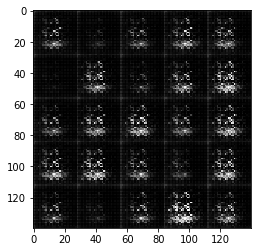

Epoch 0/2... Discriminator Loss: 1.4502... Generator Loss: 1.1262
Epoch 0/2... Discriminator Loss: 0.3683... Generator Loss: 3.5667
Epoch 0/2... Discriminator Loss: 0.1530... Generator Loss: 2.8174
Epoch 0/2... Discriminator Loss: 0.1351... Generator Loss: 3.0267
Epoch 0/2... Discriminator Loss: 0.3290... Generator Loss: 1.8694
Epoch 0/2... Discriminator Loss: 0.5019... Generator Loss: 1.9201
Epoch 0/2... Discriminator Loss: 0.1432... Generator Loss: 3.7385
Epoch 0/2... Discriminator Loss: 0.1312... Generator Loss: 3.4973
Epoch 0/2... Discriminator Loss: 0.1824... Generator Loss: 2.4463
Epoch 0/2... Discriminator Loss: 0.1396... Generator Loss: 4.2484


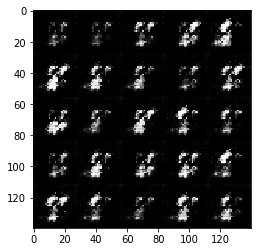

Epoch 0/2... Discriminator Loss: 0.2349... Generator Loss: 3.1371
Epoch 0/2... Discriminator Loss: 0.4727... Generator Loss: 6.3811
Epoch 0/2... Discriminator Loss: 0.1395... Generator Loss: 3.4043
Epoch 0/2... Discriminator Loss: 0.3274... Generator Loss: 1.8268
Epoch 0/2... Discriminator Loss: 0.2373... Generator Loss: 2.3541
Epoch 0/2... Discriminator Loss: 0.3563... Generator Loss: 1.6266
Epoch 0/2... Discriminator Loss: 0.1316... Generator Loss: 3.5640
Epoch 0/2... Discriminator Loss: 0.2169... Generator Loss: 2.6875
Epoch 0/2... Discriminator Loss: 0.2864... Generator Loss: 2.2173
Epoch 0/2... Discriminator Loss: 0.1435... Generator Loss: 3.0593


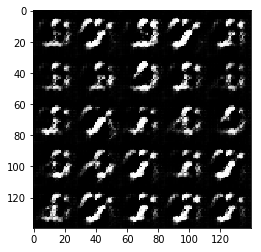

Epoch 0/2... Discriminator Loss: 0.1238... Generator Loss: 3.3857
Epoch 0/2... Discriminator Loss: 0.1638... Generator Loss: 3.5659
Epoch 0/2... Discriminator Loss: 0.3779... Generator Loss: 2.8012
Epoch 0/2... Discriminator Loss: 0.2130... Generator Loss: 2.4963
Epoch 0/2... Discriminator Loss: 0.2400... Generator Loss: 5.6305
Epoch 0/2... Discriminator Loss: 0.3499... Generator Loss: 1.7526
Epoch 0/2... Discriminator Loss: 0.0925... Generator Loss: 4.4147
Epoch 0/2... Discriminator Loss: 0.0906... Generator Loss: 3.6071
Epoch 0/2... Discriminator Loss: 0.5804... Generator Loss: 4.9713
Epoch 0/2... Discriminator Loss: 0.2898... Generator Loss: 3.2413


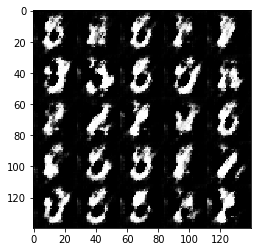

Epoch 0/2... Discriminator Loss: 0.5499... Generator Loss: 1.4878
Epoch 0/2... Discriminator Loss: 0.2482... Generator Loss: 2.1782
Epoch 0/2... Discriminator Loss: 0.2399... Generator Loss: 3.6753
Epoch 0/2... Discriminator Loss: 0.1370... Generator Loss: 3.4730
Epoch 0/2... Discriminator Loss: 0.2610... Generator Loss: 2.5712
Epoch 0/2... Discriminator Loss: 0.2275... Generator Loss: 4.5022
Epoch 0/2... Discriminator Loss: 0.2193... Generator Loss: 3.2691
Epoch 0/2... Discriminator Loss: 0.1996... Generator Loss: 2.7761
Epoch 0/2... Discriminator Loss: 0.1641... Generator Loss: 2.8707
Epoch 0/2... Discriminator Loss: 0.2089... Generator Loss: 2.3152


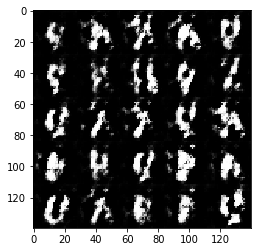

Epoch 0/2... Discriminator Loss: 0.2940... Generator Loss: 2.1703
Epoch 0/2... Discriminator Loss: 0.3601... Generator Loss: 2.1356
Epoch 0/2... Discriminator Loss: 0.3396... Generator Loss: 3.4021
Epoch 0/2... Discriminator Loss: 0.2739... Generator Loss: 2.1261
Epoch 0/2... Discriminator Loss: 0.4338... Generator Loss: 3.9087
Epoch 0/2... Discriminator Loss: 0.2190... Generator Loss: 2.3676
Epoch 0/2... Discriminator Loss: 0.3164... Generator Loss: 2.2701
Epoch 0/2... Discriminator Loss: 0.2305... Generator Loss: 2.4556
Epoch 0/2... Discriminator Loss: 1.2191... Generator Loss: 5.5696
Epoch 0/2... Discriminator Loss: 0.2211... Generator Loss: 3.6840


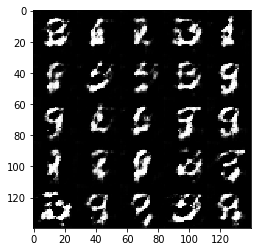

Epoch 0/2... Discriminator Loss: 0.3172... Generator Loss: 2.6335
Epoch 0/2... Discriminator Loss: 0.3966... Generator Loss: 2.0880
Epoch 0/2... Discriminator Loss: 0.7041... Generator Loss: 2.9743
Epoch 0/2... Discriminator Loss: 0.5716... Generator Loss: 2.3113
Epoch 0/2... Discriminator Loss: 0.4407... Generator Loss: 2.3293
Epoch 0/2... Discriminator Loss: 0.6470... Generator Loss: 4.1631
Epoch 0/2... Discriminator Loss: 0.3352... Generator Loss: 2.4464
Epoch 0/2... Discriminator Loss: 0.4656... Generator Loss: 1.6317
Epoch 0/2... Discriminator Loss: 0.3778... Generator Loss: 1.7260
Epoch 0/2... Discriminator Loss: 0.5679... Generator Loss: 1.3041


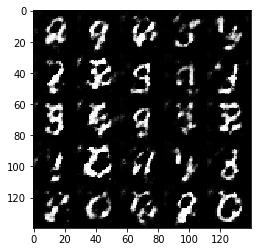

Epoch 0/2... Discriminator Loss: 0.4118... Generator Loss: 1.8969
Epoch 0/2... Discriminator Loss: 0.7381... Generator Loss: 4.3511
Epoch 0/2... Discriminator Loss: 0.5234... Generator Loss: 2.2685
Epoch 0/2... Discriminator Loss: 0.4937... Generator Loss: 1.6323
Epoch 0/2... Discriminator Loss: 0.4951... Generator Loss: 2.3235
Epoch 0/2... Discriminator Loss: 1.0193... Generator Loss: 0.8937
Epoch 0/2... Discriminator Loss: 0.5252... Generator Loss: 1.8191
Epoch 0/2... Discriminator Loss: 0.4594... Generator Loss: 1.5723
Epoch 0/2... Discriminator Loss: 0.5263... Generator Loss: 2.8818
Epoch 0/2... Discriminator Loss: 0.4951... Generator Loss: 1.8703


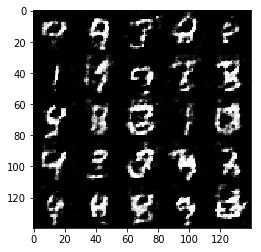

Epoch 0/2... Discriminator Loss: 0.4805... Generator Loss: 1.7397
Epoch 0/2... Discriminator Loss: 0.5342... Generator Loss: 1.7055
Epoch 0/2... Discriminator Loss: 1.0801... Generator Loss: 3.3024
Epoch 0/2... Discriminator Loss: 0.5488... Generator Loss: 1.8318
Epoch 0/2... Discriminator Loss: 0.6975... Generator Loss: 2.3676
Epoch 0/2... Discriminator Loss: 0.4925... Generator Loss: 1.4794
Epoch 0/2... Discriminator Loss: 0.7240... Generator Loss: 2.7502
Epoch 0/2... Discriminator Loss: 0.6159... Generator Loss: 1.5861
Epoch 0/2... Discriminator Loss: 0.6261... Generator Loss: 1.2919
Epoch 0/2... Discriminator Loss: 0.7286... Generator Loss: 1.1886


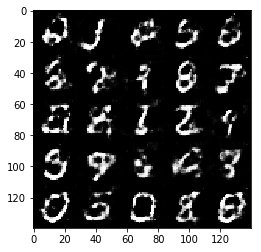

Epoch 0/2... Discriminator Loss: 0.5190... Generator Loss: 1.9728
Epoch 0/2... Discriminator Loss: 0.4429... Generator Loss: 1.8127
Epoch 0/2... Discriminator Loss: 0.7289... Generator Loss: 3.0305
Epoch 1/2... Discriminator Loss: 0.8069... Generator Loss: 2.8712
Epoch 1/2... Discriminator Loss: 0.6195... Generator Loss: 1.7492
Epoch 1/2... Discriminator Loss: 0.5193... Generator Loss: 1.5644
Epoch 1/2... Discriminator Loss: 0.6620... Generator Loss: 2.4849
Epoch 1/2... Discriminator Loss: 0.7542... Generator Loss: 1.1455
Epoch 1/2... Discriminator Loss: 0.6503... Generator Loss: 1.3244
Epoch 1/2... Discriminator Loss: 0.8427... Generator Loss: 0.9711


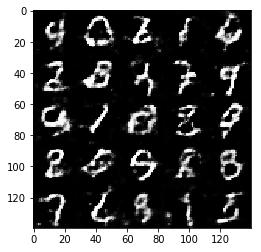

Epoch 1/2... Discriminator Loss: 0.7324... Generator Loss: 1.1219
Epoch 1/2... Discriminator Loss: 0.5225... Generator Loss: 1.7121
Epoch 1/2... Discriminator Loss: 0.7200... Generator Loss: 1.6999
Epoch 1/2... Discriminator Loss: 0.5959... Generator Loss: 1.7849
Epoch 1/2... Discriminator Loss: 0.7212... Generator Loss: 2.3649
Epoch 1/2... Discriminator Loss: 0.5754... Generator Loss: 1.3503
Epoch 1/2... Discriminator Loss: 0.5445... Generator Loss: 2.8108
Epoch 1/2... Discriminator Loss: 0.7809... Generator Loss: 1.0316
Epoch 1/2... Discriminator Loss: 0.7875... Generator Loss: 1.0167
Epoch 1/2... Discriminator Loss: 0.6778... Generator Loss: 2.2062


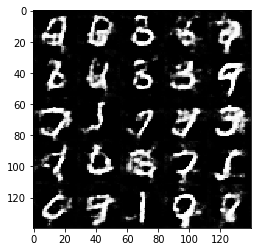

Epoch 1/2... Discriminator Loss: 0.9180... Generator Loss: 0.6932
Epoch 1/2... Discriminator Loss: 0.7427... Generator Loss: 1.1564
Epoch 1/2... Discriminator Loss: 1.4402... Generator Loss: 0.4064
Epoch 1/2... Discriminator Loss: 0.7266... Generator Loss: 1.4764
Epoch 1/2... Discriminator Loss: 0.8797... Generator Loss: 0.8174
Epoch 1/2... Discriminator Loss: 0.8395... Generator Loss: 0.7185
Epoch 1/2... Discriminator Loss: 0.7258... Generator Loss: 2.3774
Epoch 1/2... Discriminator Loss: 1.4265... Generator Loss: 0.4270
Epoch 1/2... Discriminator Loss: 0.8008... Generator Loss: 0.8640
Epoch 1/2... Discriminator Loss: 1.8550... Generator Loss: 0.2422


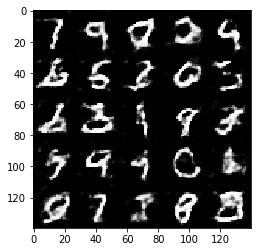

Epoch 1/2... Discriminator Loss: 0.6253... Generator Loss: 1.7309
Epoch 1/2... Discriminator Loss: 0.5509... Generator Loss: 1.4429
Epoch 1/2... Discriminator Loss: 0.6320... Generator Loss: 1.6590
Epoch 1/2... Discriminator Loss: 0.6943... Generator Loss: 1.1382
Epoch 1/2... Discriminator Loss: 0.6591... Generator Loss: 1.1634
Epoch 1/2... Discriminator Loss: 0.7043... Generator Loss: 1.2042
Epoch 1/2... Discriminator Loss: 0.6348... Generator Loss: 1.3996
Epoch 1/2... Discriminator Loss: 0.7052... Generator Loss: 1.5978
Epoch 1/2... Discriminator Loss: 0.5665... Generator Loss: 1.6842
Epoch 1/2... Discriminator Loss: 1.1031... Generator Loss: 0.6304


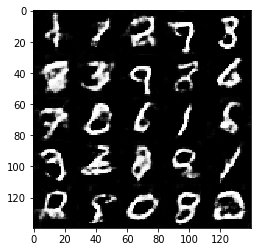

Epoch 1/2... Discriminator Loss: 0.6871... Generator Loss: 1.3441
Epoch 1/2... Discriminator Loss: 0.8861... Generator Loss: 0.8047
Epoch 1/2... Discriminator Loss: 0.7582... Generator Loss: 1.7906
Epoch 1/2... Discriminator Loss: 0.8554... Generator Loss: 0.9141
Epoch 1/2... Discriminator Loss: 0.6698... Generator Loss: 1.2532
Epoch 1/2... Discriminator Loss: 0.5842... Generator Loss: 1.4956
Epoch 1/2... Discriminator Loss: 0.9264... Generator Loss: 0.7093
Epoch 1/2... Discriminator Loss: 0.5942... Generator Loss: 1.5342
Epoch 1/2... Discriminator Loss: 0.5327... Generator Loss: 1.9754
Epoch 1/2... Discriminator Loss: 0.7780... Generator Loss: 1.0204


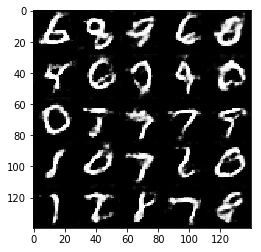

Epoch 1/2... Discriminator Loss: 0.6933... Generator Loss: 1.9892
Epoch 1/2... Discriminator Loss: 0.7795... Generator Loss: 0.8252
Epoch 1/2... Discriminator Loss: 0.7337... Generator Loss: 0.9233
Epoch 1/2... Discriminator Loss: 1.0837... Generator Loss: 0.5692
Epoch 1/2... Discriminator Loss: 0.8634... Generator Loss: 0.9126
Epoch 1/2... Discriminator Loss: 0.6605... Generator Loss: 1.2844
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 3.9704
Epoch 1/2... Discriminator Loss: 0.6780... Generator Loss: 1.2303
Epoch 1/2... Discriminator Loss: 0.6696... Generator Loss: 1.2324
Epoch 1/2... Discriminator Loss: 1.0338... Generator Loss: 0.6339


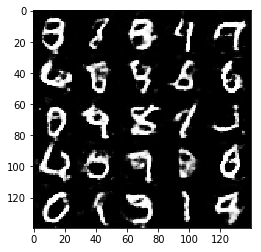

Epoch 1/2... Discriminator Loss: 0.7505... Generator Loss: 2.4097
Epoch 1/2... Discriminator Loss: 0.6110... Generator Loss: 1.0881
Epoch 1/2... Discriminator Loss: 0.5490... Generator Loss: 2.1549
Epoch 1/2... Discriminator Loss: 0.5548... Generator Loss: 1.7737
Epoch 1/2... Discriminator Loss: 0.5482... Generator Loss: 1.4678
Epoch 1/2... Discriminator Loss: 0.8096... Generator Loss: 0.8076
Epoch 1/2... Discriminator Loss: 1.2706... Generator Loss: 0.5282
Epoch 1/2... Discriminator Loss: 0.7530... Generator Loss: 0.9698
Epoch 1/2... Discriminator Loss: 0.5130... Generator Loss: 1.4524
Epoch 1/2... Discriminator Loss: 0.6944... Generator Loss: 2.0262


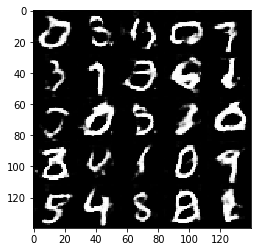

Epoch 1/2... Discriminator Loss: 0.4627... Generator Loss: 2.0220
Epoch 1/2... Discriminator Loss: 0.6220... Generator Loss: 1.3197
Epoch 1/2... Discriminator Loss: 0.6289... Generator Loss: 1.0821
Epoch 1/2... Discriminator Loss: 0.5387... Generator Loss: 1.3335
Epoch 1/2... Discriminator Loss: 0.5242... Generator Loss: 2.0851
Epoch 1/2... Discriminator Loss: 0.7225... Generator Loss: 0.9386
Epoch 1/2... Discriminator Loss: 0.6288... Generator Loss: 1.1010
Epoch 1/2... Discriminator Loss: 0.6198... Generator Loss: 1.0806
Epoch 1/2... Discriminator Loss: 0.5747... Generator Loss: 1.1340
Epoch 1/2... Discriminator Loss: 0.4111... Generator Loss: 1.8452


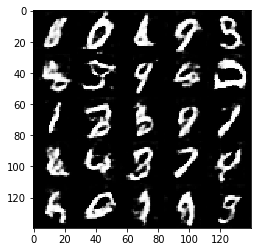

Epoch 1/2... Discriminator Loss: 0.4921... Generator Loss: 1.6182
Epoch 1/2... Discriminator Loss: 0.4998... Generator Loss: 2.1270
Epoch 1/2... Discriminator Loss: 1.1004... Generator Loss: 0.7544
Epoch 1/2... Discriminator Loss: 1.0350... Generator Loss: 0.6378
Epoch 1/2... Discriminator Loss: 0.6689... Generator Loss: 1.0855
Epoch 1/2... Discriminator Loss: 0.5550... Generator Loss: 1.7486
Epoch 1/2... Discriminator Loss: 0.5109... Generator Loss: 1.6328
Epoch 1/2... Discriminator Loss: 0.5545... Generator Loss: 1.2994
Epoch 1/2... Discriminator Loss: 0.5463... Generator Loss: 1.2659
Epoch 1/2... Discriminator Loss: 0.4605... Generator Loss: 1.5146


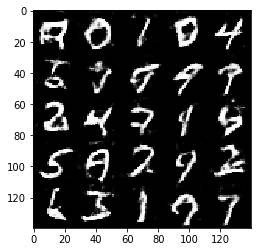

Epoch 1/2... Discriminator Loss: 0.3447... Generator Loss: 2.0544
Epoch 1/2... Discriminator Loss: 0.7283... Generator Loss: 0.8303
Epoch 1/2... Discriminator Loss: 0.5660... Generator Loss: 1.7135
Epoch 1/2... Discriminator Loss: 0.5467... Generator Loss: 1.3681
Epoch 1/2... Discriminator Loss: 0.5554... Generator Loss: 1.1777
Epoch 1/2... Discriminator Loss: 0.5265... Generator Loss: 1.2749
Epoch 1/2... Discriminator Loss: 0.4613... Generator Loss: 1.5130


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 0/1... Discriminator Loss: 0.7926... Generator Loss: 0.7580
Epoch 0/1... Discriminator Loss: 0.4309... Generator Loss: 1.3537
Epoch 0/1... Discriminator Loss: 0.4561... Generator Loss: 1.5900
Epoch 0/1... Discriminator Loss: 0.2706... Generator Loss: 1.9229
Epoch 0/1... Discriminator Loss: 0.2953... Generator Loss: 6.4437
Epoch 0/1... Discriminator Loss: 0.1106... Generator Loss: 2.4331
Epoch 0/1... Discriminator Loss: 0.0603... Generator Loss: 3.3668
Epoch 0/1... Discriminator Loss: 0.0984... Generator Loss: 2.5993
Epoch 0/1... Discriminator Loss: 0.0420... Generator Loss: 4.1661
Epoch 0/1... Discriminator Loss: 0.0429... Generator Loss: 7.7900


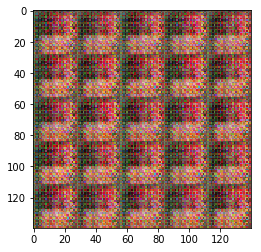

Epoch 0/1... Discriminator Loss: 1.0327... Generator Loss: 0.4618
Epoch 0/1... Discriminator Loss: 2.3755... Generator Loss: 0.1111
Epoch 0/1... Discriminator Loss: 0.2890... Generator Loss: 1.9044
Epoch 0/1... Discriminator Loss: 0.3972... Generator Loss: 14.9899
Epoch 0/1... Discriminator Loss: 0.4195... Generator Loss: 1.1948
Epoch 0/1... Discriminator Loss: 0.2454... Generator Loss: 2.5064
Epoch 0/1... Discriminator Loss: 0.2655... Generator Loss: 2.2451
Epoch 0/1... Discriminator Loss: 0.1569... Generator Loss: 2.0503
Epoch 0/1... Discriminator Loss: 0.0224... Generator Loss: 6.1266
Epoch 0/1... Discriminator Loss: 0.1601... Generator Loss: 2.3308


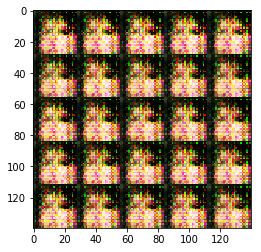

Epoch 0/1... Discriminator Loss: 0.5602... Generator Loss: 10.3205
Epoch 0/1... Discriminator Loss: 0.1431... Generator Loss: 2.5863
Epoch 0/1... Discriminator Loss: 0.0762... Generator Loss: 2.8643
Epoch 0/1... Discriminator Loss: 0.1933... Generator Loss: 2.6353
Epoch 0/1... Discriminator Loss: 0.0449... Generator Loss: 3.3998
Epoch 0/1... Discriminator Loss: 0.0784... Generator Loss: 3.1053
Epoch 0/1... Discriminator Loss: 0.0524... Generator Loss: 3.2561
Epoch 0/1... Discriminator Loss: 0.0625... Generator Loss: 3.2917
Epoch 0/1... Discriminator Loss: 0.0313... Generator Loss: 3.7055
Epoch 0/1... Discriminator Loss: 0.0367... Generator Loss: 3.4850


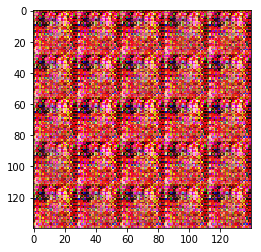

Epoch 0/1... Discriminator Loss: 0.0435... Generator Loss: 3.5978
Epoch 0/1... Discriminator Loss: 0.0933... Generator Loss: 2.9816
Epoch 0/1... Discriminator Loss: 0.1220... Generator Loss: 4.6183
Epoch 0/1... Discriminator Loss: 0.0204... Generator Loss: 8.0390
Epoch 0/1... Discriminator Loss: 0.0644... Generator Loss: 6.2538
Epoch 0/1... Discriminator Loss: 0.0740... Generator Loss: 4.6495
Epoch 0/1... Discriminator Loss: 0.1196... Generator Loss: 6.8440
Epoch 0/1... Discriminator Loss: 0.0600... Generator Loss: 3.9544
Epoch 0/1... Discriminator Loss: 0.0928... Generator Loss: 5.3360
Epoch 0/1... Discriminator Loss: 0.2313... Generator Loss: 1.8052


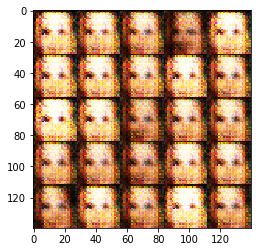

Epoch 0/1... Discriminator Loss: 1.2554... Generator Loss: 0.4352
Epoch 0/1... Discriminator Loss: 2.0963... Generator Loss: 0.4539
Epoch 0/1... Discriminator Loss: 0.4835... Generator Loss: 1.1024
Epoch 0/1... Discriminator Loss: 0.7180... Generator Loss: 1.2697
Epoch 0/1... Discriminator Loss: 0.3218... Generator Loss: 1.9303
Epoch 0/1... Discriminator Loss: 0.2163... Generator Loss: 3.0723
Epoch 0/1... Discriminator Loss: 0.8751... Generator Loss: 8.3096
Epoch 0/1... Discriminator Loss: 0.0847... Generator Loss: 4.0872
Epoch 0/1... Discriminator Loss: 1.2374... Generator Loss: 0.4346
Epoch 0/1... Discriminator Loss: 0.3920... Generator Loss: 2.1916


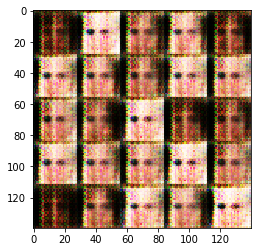

Epoch 0/1... Discriminator Loss: 0.2284... Generator Loss: 3.1954
Epoch 0/1... Discriminator Loss: 0.2857... Generator Loss: 2.4425
Epoch 0/1... Discriminator Loss: 0.3041... Generator Loss: 2.1267
Epoch 0/1... Discriminator Loss: 0.3807... Generator Loss: 4.2019
Epoch 0/1... Discriminator Loss: 0.3109... Generator Loss: 1.9986
Epoch 0/1... Discriminator Loss: 0.6290... Generator Loss: 1.1647
Epoch 0/1... Discriminator Loss: 0.7410... Generator Loss: 1.2221
Epoch 0/1... Discriminator Loss: 1.1609... Generator Loss: 1.5178
Epoch 0/1... Discriminator Loss: 1.0945... Generator Loss: 1.1205
Epoch 0/1... Discriminator Loss: 0.5499... Generator Loss: 2.0075


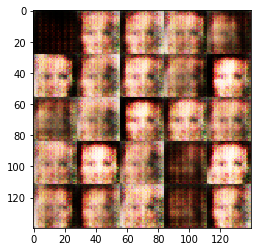

Epoch 0/1... Discriminator Loss: 0.7553... Generator Loss: 2.1595
Epoch 0/1... Discriminator Loss: 0.5363... Generator Loss: 1.3789
Epoch 0/1... Discriminator Loss: 0.6384... Generator Loss: 1.6925
Epoch 0/1... Discriminator Loss: 0.7881... Generator Loss: 0.8625
Epoch 0/1... Discriminator Loss: 0.6702... Generator Loss: 1.1084
Epoch 0/1... Discriminator Loss: 0.6419... Generator Loss: 1.2251
Epoch 0/1... Discriminator Loss: 0.4682... Generator Loss: 1.4902
Epoch 0/1... Discriminator Loss: 0.7145... Generator Loss: 1.0477
Epoch 0/1... Discriminator Loss: 0.4525... Generator Loss: 1.5787
Epoch 0/1... Discriminator Loss: 0.3651... Generator Loss: 1.7338


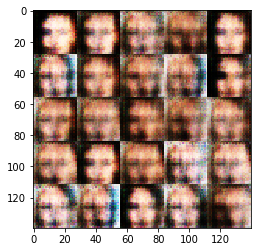

Epoch 0/1... Discriminator Loss: 0.4499... Generator Loss: 2.2379
Epoch 0/1... Discriminator Loss: 1.0559... Generator Loss: 0.7972
Epoch 0/1... Discriminator Loss: 0.5791... Generator Loss: 1.5988
Epoch 0/1... Discriminator Loss: 1.0252... Generator Loss: 0.8078
Epoch 0/1... Discriminator Loss: 0.5348... Generator Loss: 1.5492
Epoch 0/1... Discriminator Loss: 0.6559... Generator Loss: 1.4248
Epoch 0/1... Discriminator Loss: 0.9352... Generator Loss: 0.6984
Epoch 0/1... Discriminator Loss: 0.5024... Generator Loss: 1.3143
Epoch 0/1... Discriminator Loss: 0.7579... Generator Loss: 0.9861
Epoch 0/1... Discriminator Loss: 0.4028... Generator Loss: 1.7437


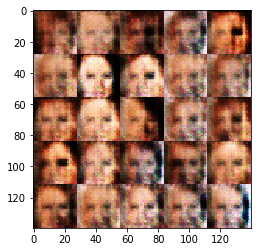

Epoch 0/1... Discriminator Loss: 0.4457... Generator Loss: 1.7977
Epoch 0/1... Discriminator Loss: 0.3380... Generator Loss: 1.7038
Epoch 0/1... Discriminator Loss: 0.7652... Generator Loss: 1.3267
Epoch 0/1... Discriminator Loss: 0.3751... Generator Loss: 1.8739
Epoch 0/1... Discriminator Loss: 1.1034... Generator Loss: 0.8230
Epoch 0/1... Discriminator Loss: 0.9538... Generator Loss: 1.0204
Epoch 0/1... Discriminator Loss: 0.7354... Generator Loss: 1.1829
Epoch 0/1... Discriminator Loss: 1.2992... Generator Loss: 0.4702
Epoch 0/1... Discriminator Loss: 1.4033... Generator Loss: 0.4153
Epoch 0/1... Discriminator Loss: 1.0288... Generator Loss: 1.2496


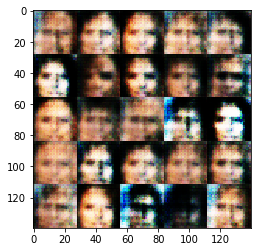

Epoch 0/1... Discriminator Loss: 0.9267... Generator Loss: 0.7378
Epoch 0/1... Discriminator Loss: 0.5839... Generator Loss: 2.0529
Epoch 0/1... Discriminator Loss: 0.7015... Generator Loss: 1.0659
Epoch 0/1... Discriminator Loss: 0.9330... Generator Loss: 1.0379
Epoch 0/1... Discriminator Loss: 1.5528... Generator Loss: 1.2327
Epoch 0/1... Discriminator Loss: 0.8551... Generator Loss: 0.7628
Epoch 0/1... Discriminator Loss: 0.8014... Generator Loss: 1.0692
Epoch 0/1... Discriminator Loss: 0.8606... Generator Loss: 1.8235
Epoch 0/1... Discriminator Loss: 0.7683... Generator Loss: 1.1848
Epoch 0/1... Discriminator Loss: 0.6419... Generator Loss: 1.3743


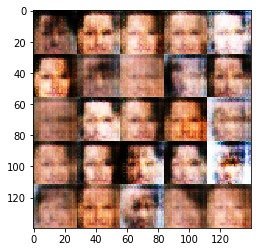

Epoch 0/1... Discriminator Loss: 1.1368... Generator Loss: 0.6038
Epoch 0/1... Discriminator Loss: 0.3719... Generator Loss: 1.9683
Epoch 0/1... Discriminator Loss: 0.5690... Generator Loss: 1.4152
Epoch 0/1... Discriminator Loss: 0.9740... Generator Loss: 1.0122
Epoch 0/1... Discriminator Loss: 0.8347... Generator Loss: 1.1357
Epoch 0/1... Discriminator Loss: 0.8065... Generator Loss: 1.8388
Epoch 0/1... Discriminator Loss: 0.7958... Generator Loss: 1.3503
Epoch 0/1... Discriminator Loss: 0.8914... Generator Loss: 2.2774
Epoch 0/1... Discriminator Loss: 0.9724... Generator Loss: 0.8258
Epoch 0/1... Discriminator Loss: 0.9726... Generator Loss: 0.6407


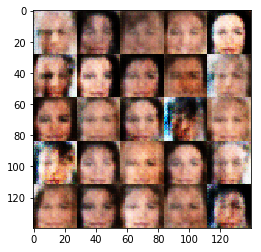

Epoch 0/1... Discriminator Loss: 0.7372... Generator Loss: 1.4889
Epoch 0/1... Discriminator Loss: 0.6134... Generator Loss: 1.3599
Epoch 0/1... Discriminator Loss: 0.7853... Generator Loss: 1.4146
Epoch 0/1... Discriminator Loss: 0.6304... Generator Loss: 1.1983
Epoch 0/1... Discriminator Loss: 0.9756... Generator Loss: 1.3661
Epoch 0/1... Discriminator Loss: 1.0003... Generator Loss: 0.6507
Epoch 0/1... Discriminator Loss: 0.5995... Generator Loss: 1.9341
Epoch 0/1... Discriminator Loss: 0.9957... Generator Loss: 1.4845
Epoch 0/1... Discriminator Loss: 0.6080... Generator Loss: 1.5357
Epoch 0/1... Discriminator Loss: 1.0613... Generator Loss: 1.1921


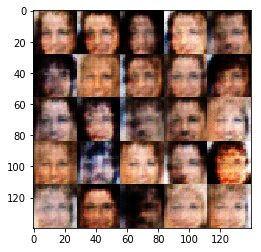

Epoch 0/1... Discriminator Loss: 1.0043... Generator Loss: 0.8607
Epoch 0/1... Discriminator Loss: 0.9286... Generator Loss: 1.2077
Epoch 0/1... Discriminator Loss: 0.4551... Generator Loss: 1.8328
Epoch 0/1... Discriminator Loss: 1.2728... Generator Loss: 0.5095
Epoch 0/1... Discriminator Loss: 0.8120... Generator Loss: 1.7008
Epoch 0/1... Discriminator Loss: 0.5996... Generator Loss: 1.4703
Epoch 0/1... Discriminator Loss: 0.5733... Generator Loss: 1.5513
Epoch 0/1... Discriminator Loss: 1.1845... Generator Loss: 0.9648
Epoch 0/1... Discriminator Loss: 0.4959... Generator Loss: 1.5916
Epoch 0/1... Discriminator Loss: 1.3337... Generator Loss: 0.4933


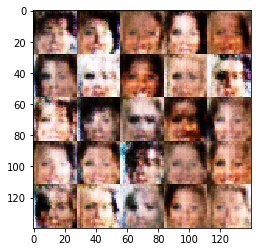

Epoch 0/1... Discriminator Loss: 1.1849... Generator Loss: 0.6802
Epoch 0/1... Discriminator Loss: 0.8091... Generator Loss: 1.0483
Epoch 0/1... Discriminator Loss: 0.7753... Generator Loss: 0.9625
Epoch 0/1... Discriminator Loss: 0.8176... Generator Loss: 0.9478
Epoch 0/1... Discriminator Loss: 0.9051... Generator Loss: 0.8715
Epoch 0/1... Discriminator Loss: 0.9016... Generator Loss: 1.5975
Epoch 0/1... Discriminator Loss: 0.7982... Generator Loss: 1.6460
Epoch 0/1... Discriminator Loss: 0.8229... Generator Loss: 1.0193
Epoch 0/1... Discriminator Loss: 0.7881... Generator Loss: 1.0794
Epoch 0/1... Discriminator Loss: 0.6045... Generator Loss: 1.3371


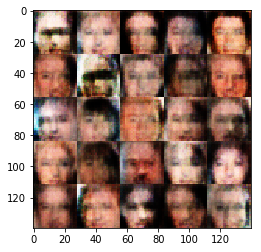

Epoch 0/1... Discriminator Loss: 0.9415... Generator Loss: 1.2542
Epoch 0/1... Discriminator Loss: 0.8024... Generator Loss: 1.0189
Epoch 0/1... Discriminator Loss: 0.8320... Generator Loss: 0.8950
Epoch 0/1... Discriminator Loss: 0.6375... Generator Loss: 2.1161
Epoch 0/1... Discriminator Loss: 1.1312... Generator Loss: 0.5569
Epoch 0/1... Discriminator Loss: 0.7036... Generator Loss: 1.8989
Epoch 0/1... Discriminator Loss: 0.8997... Generator Loss: 0.8374
Epoch 0/1... Discriminator Loss: 0.8606... Generator Loss: 1.6154
Epoch 0/1... Discriminator Loss: 1.1975... Generator Loss: 0.8697
Epoch 0/1... Discriminator Loss: 0.9393... Generator Loss: 0.9990


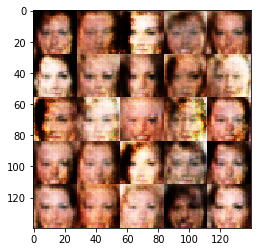

Epoch 0/1... Discriminator Loss: 1.0244... Generator Loss: 0.9610
Epoch 0/1... Discriminator Loss: 0.7912... Generator Loss: 1.4569
Epoch 0/1... Discriminator Loss: 0.6734... Generator Loss: 1.1102
Epoch 0/1... Discriminator Loss: 1.0315... Generator Loss: 1.3370
Epoch 0/1... Discriminator Loss: 1.1411... Generator Loss: 0.9313
Epoch 0/1... Discriminator Loss: 0.9701... Generator Loss: 0.8717
Epoch 0/1... Discriminator Loss: 0.8618... Generator Loss: 0.9201
Epoch 0/1... Discriminator Loss: 0.9302... Generator Loss: 1.0761
Epoch 0/1... Discriminator Loss: 1.0731... Generator Loss: 0.6562
Epoch 0/1... Discriminator Loss: 0.7328... Generator Loss: 1.6474


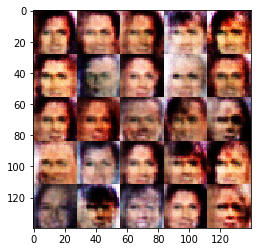

Epoch 0/1... Discriminator Loss: 1.2307... Generator Loss: 0.4872
Epoch 0/1... Discriminator Loss: 1.0828... Generator Loss: 0.6210
Epoch 0/1... Discriminator Loss: 0.9453... Generator Loss: 1.2241
Epoch 0/1... Discriminator Loss: 0.7792... Generator Loss: 1.1427
Epoch 0/1... Discriminator Loss: 0.6461... Generator Loss: 1.3136
Epoch 0/1... Discriminator Loss: 0.5990... Generator Loss: 2.0758
Epoch 0/1... Discriminator Loss: 0.8253... Generator Loss: 1.0759
Epoch 0/1... Discriminator Loss: 1.0456... Generator Loss: 0.7495
Epoch 0/1... Discriminator Loss: 0.9261... Generator Loss: 0.7769
Epoch 0/1... Discriminator Loss: 0.7093... Generator Loss: 1.4373


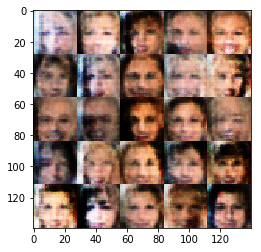

Epoch 0/1... Discriminator Loss: 1.1049... Generator Loss: 0.7492
Epoch 0/1... Discriminator Loss: 0.9742... Generator Loss: 1.3548
Epoch 0/1... Discriminator Loss: 0.7634... Generator Loss: 1.0407
Epoch 0/1... Discriminator Loss: 0.9664... Generator Loss: 1.1592
Epoch 0/1... Discriminator Loss: 0.7478... Generator Loss: 1.4848
Epoch 0/1... Discriminator Loss: 0.8252... Generator Loss: 0.9315
Epoch 0/1... Discriminator Loss: 0.7898... Generator Loss: 1.4673
Epoch 0/1... Discriminator Loss: 1.3803... Generator Loss: 0.4344
Epoch 0/1... Discriminator Loss: 1.3442... Generator Loss: 0.4625
Epoch 0/1... Discriminator Loss: 0.7814... Generator Loss: 1.4704


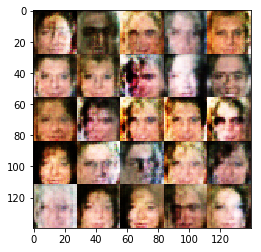

Epoch 0/1... Discriminator Loss: 0.9082... Generator Loss: 1.2975
Epoch 0/1... Discriminator Loss: 0.9586... Generator Loss: 0.9736
Epoch 0/1... Discriminator Loss: 1.4148... Generator Loss: 0.5145
Epoch 0/1... Discriminator Loss: 0.9672... Generator Loss: 0.7805
Epoch 0/1... Discriminator Loss: 0.6997... Generator Loss: 1.4494
Epoch 0/1... Discriminator Loss: 1.0158... Generator Loss: 0.7271
Epoch 0/1... Discriminator Loss: 0.8080... Generator Loss: 1.2137
Epoch 0/1... Discriminator Loss: 1.0976... Generator Loss: 1.1347
Epoch 0/1... Discriminator Loss: 0.9031... Generator Loss: 1.1540
Epoch 0/1... Discriminator Loss: 1.0227... Generator Loss: 0.8044


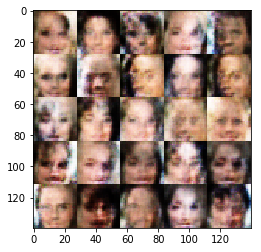

Epoch 0/1... Discriminator Loss: 0.7483... Generator Loss: 1.0566
Epoch 0/1... Discriminator Loss: 1.0305... Generator Loss: 0.9704
Epoch 0/1... Discriminator Loss: 0.8953... Generator Loss: 1.4735
Epoch 0/1... Discriminator Loss: 0.5723... Generator Loss: 1.5373
Epoch 0/1... Discriminator Loss: 0.9332... Generator Loss: 1.1391
Epoch 0/1... Discriminator Loss: 0.9242... Generator Loss: 0.7459
Epoch 0/1... Discriminator Loss: 0.6588... Generator Loss: 1.2045
Epoch 0/1... Discriminator Loss: 1.0047... Generator Loss: 0.7190
Epoch 0/1... Discriminator Loss: 1.0605... Generator Loss: 0.6610
Epoch 0/1... Discriminator Loss: 0.7601... Generator Loss: 1.9064


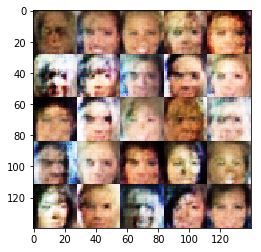

Epoch 0/1... Discriminator Loss: 1.1449... Generator Loss: 0.9000
Epoch 0/1... Discriminator Loss: 0.8343... Generator Loss: 0.9270
Epoch 0/1... Discriminator Loss: 0.5861... Generator Loss: 1.5050
Epoch 0/1... Discriminator Loss: 0.7937... Generator Loss: 1.1739
Epoch 0/1... Discriminator Loss: 0.9185... Generator Loss: 1.4061
Epoch 0/1... Discriminator Loss: 1.0064... Generator Loss: 0.7547
Epoch 0/1... Discriminator Loss: 0.8659... Generator Loss: 0.7202
Epoch 0/1... Discriminator Loss: 1.3944... Generator Loss: 0.4654
Epoch 0/1... Discriminator Loss: 0.9898... Generator Loss: 1.0696
Epoch 0/1... Discriminator Loss: 0.8909... Generator Loss: 0.8816


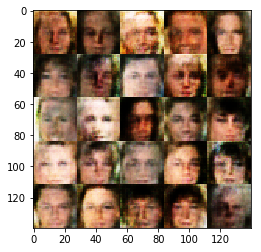

Epoch 0/1... Discriminator Loss: 0.8279... Generator Loss: 1.0348
Epoch 0/1... Discriminator Loss: 0.7729... Generator Loss: 0.9284
Epoch 0/1... Discriminator Loss: 1.1564... Generator Loss: 0.6372
Epoch 0/1... Discriminator Loss: 0.8881... Generator Loss: 0.9379
Epoch 0/1... Discriminator Loss: 1.0194... Generator Loss: 0.7247
Epoch 0/1... Discriminator Loss: 1.1846... Generator Loss: 0.6241
Epoch 0/1... Discriminator Loss: 0.9953... Generator Loss: 0.7905
Epoch 0/1... Discriminator Loss: 1.2884... Generator Loss: 0.4772
Epoch 0/1... Discriminator Loss: 0.8037... Generator Loss: 0.9536
Epoch 0/1... Discriminator Loss: 0.8652... Generator Loss: 0.7506


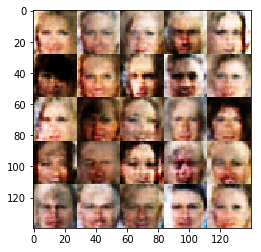

Epoch 0/1... Discriminator Loss: 1.2728... Generator Loss: 0.5184
Epoch 0/1... Discriminator Loss: 1.0219... Generator Loss: 0.7423
Epoch 0/1... Discriminator Loss: 1.1356... Generator Loss: 0.7226
Epoch 0/1... Discriminator Loss: 0.9606... Generator Loss: 0.8074
Epoch 0/1... Discriminator Loss: 0.8257... Generator Loss: 1.0653
Epoch 0/1... Discriminator Loss: 0.8234... Generator Loss: 0.9351
Epoch 0/1... Discriminator Loss: 0.9658... Generator Loss: 0.9924
Epoch 0/1... Discriminator Loss: 0.9518... Generator Loss: 0.7578
Epoch 0/1... Discriminator Loss: 1.0429... Generator Loss: 0.6883
Epoch 0/1... Discriminator Loss: 0.9410... Generator Loss: 1.1702


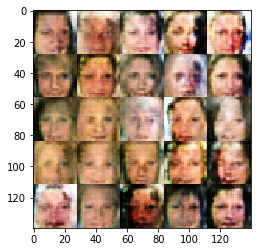

Epoch 0/1... Discriminator Loss: 0.8866... Generator Loss: 1.1439
Epoch 0/1... Discriminator Loss: 0.9426... Generator Loss: 1.0495
Epoch 0/1... Discriminator Loss: 0.9838... Generator Loss: 0.8891
Epoch 0/1... Discriminator Loss: 0.6760... Generator Loss: 1.4943
Epoch 0/1... Discriminator Loss: 0.9786... Generator Loss: 0.7653
Epoch 0/1... Discriminator Loss: 1.1008... Generator Loss: 0.9079
Epoch 0/1... Discriminator Loss: 1.0479... Generator Loss: 0.8794
Epoch 0/1... Discriminator Loss: 0.8410... Generator Loss: 0.9473
Epoch 0/1... Discriminator Loss: 1.0905... Generator Loss: 0.6184
Epoch 0/1... Discriminator Loss: 0.9969... Generator Loss: 0.7728


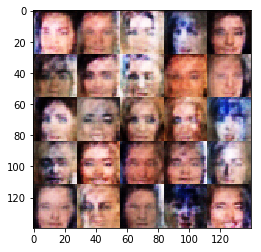

Epoch 0/1... Discriminator Loss: 0.8591... Generator Loss: 1.4533
Epoch 0/1... Discriminator Loss: 1.2933... Generator Loss: 0.5513
Epoch 0/1... Discriminator Loss: 1.1658... Generator Loss: 0.6174
Epoch 0/1... Discriminator Loss: 1.1528... Generator Loss: 0.7867
Epoch 0/1... Discriminator Loss: 1.2199... Generator Loss: 0.6415
Epoch 0/1... Discriminator Loss: 0.9131... Generator Loss: 0.9740
Epoch 0/1... Discriminator Loss: 0.7700... Generator Loss: 1.0068
Epoch 0/1... Discriminator Loss: 0.7453... Generator Loss: 1.2024
Epoch 0/1... Discriminator Loss: 1.0668... Generator Loss: 0.6848
Epoch 0/1... Discriminator Loss: 1.0970... Generator Loss: 0.6215


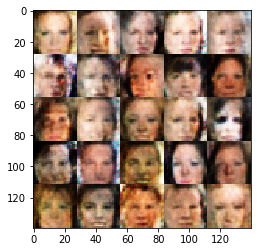

Epoch 0/1... Discriminator Loss: 1.0023... Generator Loss: 0.8722
Epoch 0/1... Discriminator Loss: 0.7837... Generator Loss: 0.9155
Epoch 0/1... Discriminator Loss: 0.8907... Generator Loss: 0.7620
Epoch 0/1... Discriminator Loss: 1.0801... Generator Loss: 0.8526
Epoch 0/1... Discriminator Loss: 1.1509... Generator Loss: 2.4721
Epoch 0/1... Discriminator Loss: 1.1139... Generator Loss: 0.6464
Epoch 0/1... Discriminator Loss: 0.8839... Generator Loss: 0.8626
Epoch 0/1... Discriminator Loss: 1.2951... Generator Loss: 0.4658
Epoch 0/1... Discriminator Loss: 0.9796... Generator Loss: 0.6758
Epoch 0/1... Discriminator Loss: 1.1999... Generator Loss: 0.5301


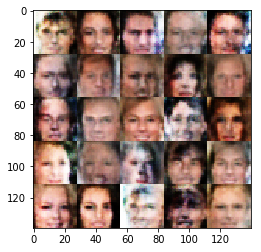

Epoch 0/1... Discriminator Loss: 1.0078... Generator Loss: 0.9004
Epoch 0/1... Discriminator Loss: 1.1374... Generator Loss: 0.9496
Epoch 0/1... Discriminator Loss: 0.8611... Generator Loss: 1.0188
Epoch 0/1... Discriminator Loss: 1.1209... Generator Loss: 0.6204
Epoch 0/1... Discriminator Loss: 1.0659... Generator Loss: 0.9300
Epoch 0/1... Discriminator Loss: 0.8535... Generator Loss: 1.1318
Epoch 0/1... Discriminator Loss: 0.9053... Generator Loss: 0.8722
Epoch 0/1... Discriminator Loss: 0.9306... Generator Loss: 0.9124
Epoch 0/1... Discriminator Loss: 0.9933... Generator Loss: 0.8124
Epoch 0/1... Discriminator Loss: 1.1254... Generator Loss: 0.6704


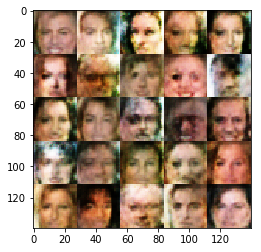

Epoch 0/1... Discriminator Loss: 1.0743... Generator Loss: 0.7168
Epoch 0/1... Discriminator Loss: 0.8508... Generator Loss: 1.1138
Epoch 0/1... Discriminator Loss: 1.1204... Generator Loss: 0.6561
Epoch 0/1... Discriminator Loss: 0.9877... Generator Loss: 0.7647
Epoch 0/1... Discriminator Loss: 1.0492... Generator Loss: 0.7632
Epoch 0/1... Discriminator Loss: 0.9752... Generator Loss: 1.0606
Epoch 0/1... Discriminator Loss: 0.7380... Generator Loss: 1.0978
Epoch 0/1... Discriminator Loss: 0.9345... Generator Loss: 0.8593
Epoch 0/1... Discriminator Loss: 0.6088... Generator Loss: 1.2702
Epoch 0/1... Discriminator Loss: 1.6289... Generator Loss: 0.3651


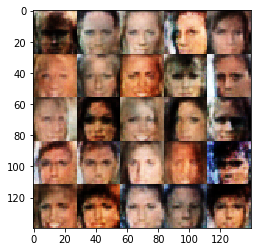

Epoch 0/1... Discriminator Loss: 1.0152... Generator Loss: 0.8944
Epoch 0/1... Discriminator Loss: 1.2008... Generator Loss: 0.5124
Epoch 0/1... Discriminator Loss: 1.2765... Generator Loss: 0.5553
Epoch 0/1... Discriminator Loss: 1.1185... Generator Loss: 0.5924
Epoch 0/1... Discriminator Loss: 0.8989... Generator Loss: 1.0640
Epoch 0/1... Discriminator Loss: 0.8518... Generator Loss: 1.1234
Epoch 0/1... Discriminator Loss: 0.8742... Generator Loss: 1.2364
Epoch 0/1... Discriminator Loss: 0.9532... Generator Loss: 1.1298
Epoch 0/1... Discriminator Loss: 1.2264... Generator Loss: 0.5578
Epoch 0/1... Discriminator Loss: 1.1583... Generator Loss: 0.9428


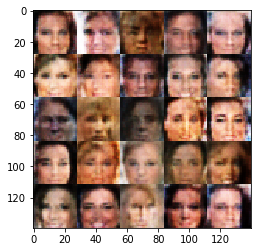

Epoch 0/1... Discriminator Loss: 0.8207... Generator Loss: 1.4423
Epoch 0/1... Discriminator Loss: 0.8605... Generator Loss: 0.9446
Epoch 0/1... Discriminator Loss: 0.9975... Generator Loss: 0.9605
Epoch 0/1... Discriminator Loss: 1.1152... Generator Loss: 1.0636
Epoch 0/1... Discriminator Loss: 1.1811... Generator Loss: 0.6328
Epoch 0/1... Discriminator Loss: 1.1600... Generator Loss: 0.4939
Epoch 0/1... Discriminator Loss: 1.0525... Generator Loss: 0.9571
Epoch 0/1... Discriminator Loss: 0.7596... Generator Loss: 1.1036
Epoch 0/1... Discriminator Loss: 0.7714... Generator Loss: 1.1629
Epoch 0/1... Discriminator Loss: 1.2182... Generator Loss: 0.5201


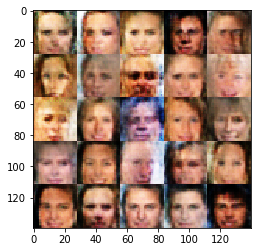

Epoch 0/1... Discriminator Loss: 1.0445... Generator Loss: 0.6329
Epoch 0/1... Discriminator Loss: 1.0069... Generator Loss: 0.6428
Epoch 0/1... Discriminator Loss: 1.3985... Generator Loss: 0.4349
Epoch 0/1... Discriminator Loss: 1.1770... Generator Loss: 0.6509
Epoch 0/1... Discriminator Loss: 0.6914... Generator Loss: 1.2680
Epoch 0/1... Discriminator Loss: 0.9090... Generator Loss: 1.3030
Epoch 0/1... Discriminator Loss: 0.9832... Generator Loss: 1.2425
Epoch 0/1... Discriminator Loss: 0.9309... Generator Loss: 0.9131
Epoch 0/1... Discriminator Loss: 0.8313... Generator Loss: 1.2074
Epoch 0/1... Discriminator Loss: 0.8303... Generator Loss: 0.9414


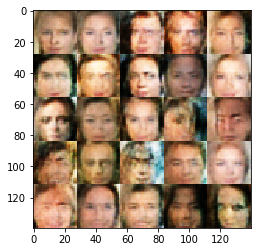

Epoch 0/1... Discriminator Loss: 0.9389... Generator Loss: 0.8512
Epoch 0/1... Discriminator Loss: 1.0098... Generator Loss: 0.7432
Epoch 0/1... Discriminator Loss: 1.0275... Generator Loss: 0.7543
Epoch 0/1... Discriminator Loss: 1.0955... Generator Loss: 0.8622
Epoch 0/1... Discriminator Loss: 1.1022... Generator Loss: 0.8948
Epoch 0/1... Discriminator Loss: 0.7684... Generator Loss: 1.0167
Epoch 0/1... Discriminator Loss: 0.9771... Generator Loss: 1.0678
Epoch 0/1... Discriminator Loss: 1.1875... Generator Loss: 0.4772
Epoch 0/1... Discriminator Loss: 1.0839... Generator Loss: 0.5901
Epoch 0/1... Discriminator Loss: 1.1174... Generator Loss: 0.7590


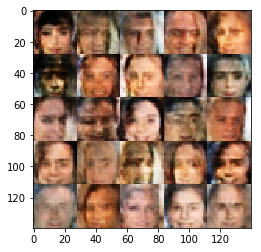

Epoch 0/1... Discriminator Loss: 1.1225... Generator Loss: 0.6575
Epoch 0/1... Discriminator Loss: 1.1251... Generator Loss: 0.6161
Epoch 0/1... Discriminator Loss: 1.0774... Generator Loss: 1.2829
Epoch 0/1... Discriminator Loss: 1.1645... Generator Loss: 0.5651
Epoch 0/1... Discriminator Loss: 0.7888... Generator Loss: 1.2766
Epoch 0/1... Discriminator Loss: 1.2035... Generator Loss: 0.6497
Epoch 0/1... Discriminator Loss: 0.9804... Generator Loss: 0.7884
Epoch 0/1... Discriminator Loss: 1.2172... Generator Loss: 0.5274
Epoch 0/1... Discriminator Loss: 1.0049... Generator Loss: 0.9964
Epoch 0/1... Discriminator Loss: 1.2030... Generator Loss: 0.5228


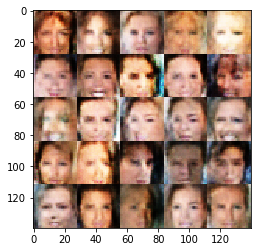

Epoch 0/1... Discriminator Loss: 1.1094... Generator Loss: 0.9071
Epoch 0/1... Discriminator Loss: 0.8456... Generator Loss: 0.8483
Epoch 0/1... Discriminator Loss: 0.6473... Generator Loss: 1.4262
Epoch 0/1... Discriminator Loss: 0.9611... Generator Loss: 0.8166
Epoch 0/1... Discriminator Loss: 0.9152... Generator Loss: 0.9231
Epoch 0/1... Discriminator Loss: 1.1825... Generator Loss: 0.6361
Epoch 0/1... Discriminator Loss: 0.7703... Generator Loss: 1.3812
Epoch 0/1... Discriminator Loss: 0.7477... Generator Loss: 1.0340
Epoch 0/1... Discriminator Loss: 0.9292... Generator Loss: 0.9382
Epoch 0/1... Discriminator Loss: 0.6357... Generator Loss: 1.2113


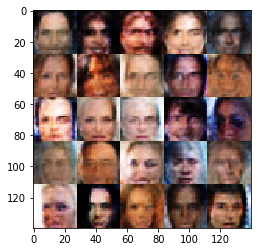

Epoch 0/1... Discriminator Loss: 0.8262... Generator Loss: 1.0116
Epoch 0/1... Discriminator Loss: 0.9604... Generator Loss: 0.8109
Epoch 0/1... Discriminator Loss: 0.7507... Generator Loss: 1.0975
Epoch 0/1... Discriminator Loss: 0.9947... Generator Loss: 0.7890
Epoch 0/1... Discriminator Loss: 0.9006... Generator Loss: 0.9269
Epoch 0/1... Discriminator Loss: 1.4443... Generator Loss: 0.3711
Epoch 0/1... Discriminator Loss: 1.3191... Generator Loss: 1.4434
Epoch 0/1... Discriminator Loss: 0.8163... Generator Loss: 1.0060
Epoch 0/1... Discriminator Loss: 0.8714... Generator Loss: 1.0118
Epoch 0/1... Discriminator Loss: 0.9269... Generator Loss: 0.8072


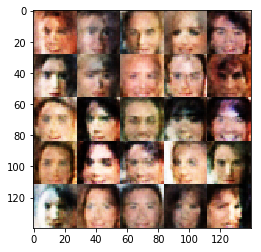

Epoch 0/1... Discriminator Loss: 0.8474... Generator Loss: 1.3763
Epoch 0/1... Discriminator Loss: 0.6946... Generator Loss: 1.1742
Epoch 0/1... Discriminator Loss: 0.9632... Generator Loss: 1.1301
Epoch 0/1... Discriminator Loss: 0.7567... Generator Loss: 1.1494
Epoch 0/1... Discriminator Loss: 0.9341... Generator Loss: 0.7755
Epoch 0/1... Discriminator Loss: 1.0723... Generator Loss: 0.6358
Epoch 0/1... Discriminator Loss: 1.1409... Generator Loss: 0.5606
Epoch 0/1... Discriminator Loss: 0.7931... Generator Loss: 1.2744
Epoch 0/1... Discriminator Loss: 1.0067... Generator Loss: 1.2736
Epoch 0/1... Discriminator Loss: 0.7327... Generator Loss: 1.0501


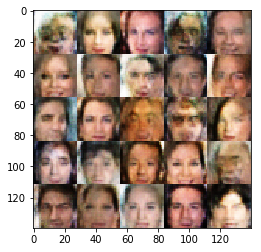

Epoch 0/1... Discriminator Loss: 0.8671... Generator Loss: 0.9605
Epoch 0/1... Discriminator Loss: 1.0549... Generator Loss: 0.6767
Epoch 0/1... Discriminator Loss: 1.1912... Generator Loss: 0.4819
Epoch 0/1... Discriminator Loss: 0.7674... Generator Loss: 1.1019
Epoch 0/1... Discriminator Loss: 1.0299... Generator Loss: 0.6156
Epoch 0/1... Discriminator Loss: 0.8478... Generator Loss: 1.0568
Epoch 0/1... Discriminator Loss: 0.7152... Generator Loss: 1.1681
Epoch 0/1... Discriminator Loss: 0.9896... Generator Loss: 1.0291
Epoch 0/1... Discriminator Loss: 1.3539... Generator Loss: 0.4484
Epoch 0/1... Discriminator Loss: 1.1646... Generator Loss: 0.4842


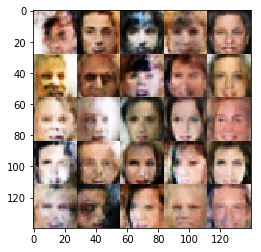

Epoch 0/1... Discriminator Loss: 0.7619... Generator Loss: 1.7959
Epoch 0/1... Discriminator Loss: 1.2190... Generator Loss: 0.5009
Epoch 0/1... Discriminator Loss: 0.8915... Generator Loss: 0.9729
Epoch 0/1... Discriminator Loss: 1.2287... Generator Loss: 0.4959
Epoch 0/1... Discriminator Loss: 0.8649... Generator Loss: 0.9872
Epoch 0/1... Discriminator Loss: 1.3149... Generator Loss: 0.6635
Epoch 0/1... Discriminator Loss: 0.7789... Generator Loss: 1.1671
Epoch 0/1... Discriminator Loss: 0.4970... Generator Loss: 1.5719
Epoch 0/1... Discriminator Loss: 1.1024... Generator Loss: 1.0591
Epoch 0/1... Discriminator Loss: 0.9253... Generator Loss: 0.7882


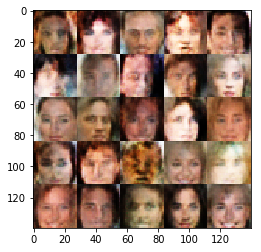

Epoch 0/1... Discriminator Loss: 0.7996... Generator Loss: 0.9078
Epoch 0/1... Discriminator Loss: 0.9794... Generator Loss: 0.8883
Epoch 0/1... Discriminator Loss: 0.7607... Generator Loss: 1.3701
Epoch 0/1... Discriminator Loss: 0.7538... Generator Loss: 2.2864
Epoch 0/1... Discriminator Loss: 1.0911... Generator Loss: 1.3667
Epoch 0/1... Discriminator Loss: 0.9582... Generator Loss: 0.7371
Epoch 0/1... Discriminator Loss: 0.7739... Generator Loss: 1.3339
Epoch 0/1... Discriminator Loss: 1.1768... Generator Loss: 0.5454
Epoch 0/1... Discriminator Loss: 1.0495... Generator Loss: 0.7139
Epoch 0/1... Discriminator Loss: 0.6301... Generator Loss: 1.2216


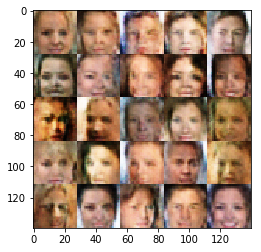

Epoch 0/1... Discriminator Loss: 1.3874... Generator Loss: 0.4707
Epoch 0/1... Discriminator Loss: 1.0884... Generator Loss: 0.5918
Epoch 0/1... Discriminator Loss: 0.9930... Generator Loss: 0.6493
Epoch 0/1... Discriminator Loss: 0.8241... Generator Loss: 1.4388
Epoch 0/1... Discriminator Loss: 0.9459... Generator Loss: 0.9289
Epoch 0/1... Discriminator Loss: 1.0735... Generator Loss: 0.5993
Epoch 0/1... Discriminator Loss: 0.9732... Generator Loss: 0.8397
Epoch 0/1... Discriminator Loss: 0.8966... Generator Loss: 1.5326
Epoch 0/1... Discriminator Loss: 0.8784... Generator Loss: 0.8802
Epoch 0/1... Discriminator Loss: 1.0028... Generator Loss: 0.8294


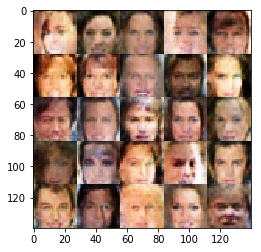

Epoch 0/1... Discriminator Loss: 0.9608... Generator Loss: 0.8378
Epoch 0/1... Discriminator Loss: 0.9266... Generator Loss: 0.8534
Epoch 0/1... Discriminator Loss: 0.8172... Generator Loss: 1.3549
Epoch 0/1... Discriminator Loss: 1.0371... Generator Loss: 0.7927
Epoch 0/1... Discriminator Loss: 0.7610... Generator Loss: 1.1644
Epoch 0/1... Discriminator Loss: 0.7518... Generator Loss: 1.1011
Epoch 0/1... Discriminator Loss: 0.8739... Generator Loss: 0.8838
Epoch 0/1... Discriminator Loss: 0.8983... Generator Loss: 0.7583
Epoch 0/1... Discriminator Loss: 0.9840... Generator Loss: 0.8530
Epoch 0/1... Discriminator Loss: 0.6796... Generator Loss: 1.3054


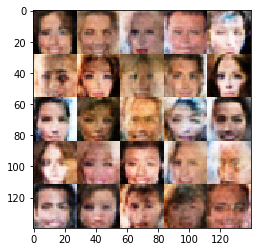

Epoch 0/1... Discriminator Loss: 0.8500... Generator Loss: 0.8400
Epoch 0/1... Discriminator Loss: 0.6221... Generator Loss: 1.3974
Epoch 0/1... Discriminator Loss: 0.8058... Generator Loss: 0.9358
Epoch 0/1... Discriminator Loss: 0.7195... Generator Loss: 1.1440
Epoch 0/1... Discriminator Loss: 0.6054... Generator Loss: 1.3616
Epoch 0/1... Discriminator Loss: 0.9967... Generator Loss: 0.7691
Epoch 0/1... Discriminator Loss: 1.2684... Generator Loss: 0.8073
Epoch 0/1... Discriminator Loss: 1.1526... Generator Loss: 0.5822
Epoch 0/1... Discriminator Loss: 0.8822... Generator Loss: 0.8032
Epoch 0/1... Discriminator Loss: 1.0315... Generator Loss: 0.7125


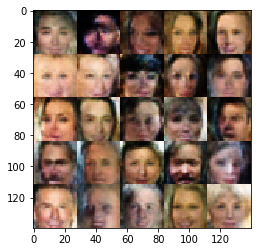

Epoch 0/1... Discriminator Loss: 1.2733... Generator Loss: 0.9295
Epoch 0/1... Discriminator Loss: 1.0845... Generator Loss: 0.8709
Epoch 0/1... Discriminator Loss: 1.2627... Generator Loss: 0.5359
Epoch 0/1... Discriminator Loss: 1.2266... Generator Loss: 0.5070
Epoch 0/1... Discriminator Loss: 0.8950... Generator Loss: 1.1112
Epoch 0/1... Discriminator Loss: 0.6786... Generator Loss: 1.2575
Epoch 0/1... Discriminator Loss: 0.5797... Generator Loss: 1.2522
Epoch 0/1... Discriminator Loss: 0.9726... Generator Loss: 0.8423
Epoch 0/1... Discriminator Loss: 0.9703... Generator Loss: 0.7980
Epoch 0/1... Discriminator Loss: 1.0809... Generator Loss: 0.6151


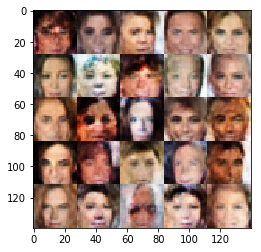

Epoch 0/1... Discriminator Loss: 1.0231... Generator Loss: 1.3794
Epoch 0/1... Discriminator Loss: 0.9049... Generator Loss: 0.7937
Epoch 0/1... Discriminator Loss: 1.3422... Generator Loss: 0.6052
Epoch 0/1... Discriminator Loss: 1.0314... Generator Loss: 0.7983
Epoch 0/1... Discriminator Loss: 0.9581... Generator Loss: 0.7422
Epoch 0/1... Discriminator Loss: 1.3590... Generator Loss: 0.5118
Epoch 0/1... Discriminator Loss: 0.7353... Generator Loss: 1.2908
Epoch 0/1... Discriminator Loss: 1.2521... Generator Loss: 1.0218
Epoch 0/1... Discriminator Loss: 1.0073... Generator Loss: 1.0051
Epoch 0/1... Discriminator Loss: 1.1716... Generator Loss: 0.6010


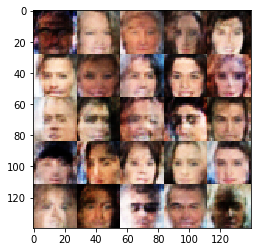

Epoch 0/1... Discriminator Loss: 1.2281... Generator Loss: 0.4946
Epoch 0/1... Discriminator Loss: 0.9605... Generator Loss: 0.8538
Epoch 0/1... Discriminator Loss: 1.0638... Generator Loss: 0.5753
Epoch 0/1... Discriminator Loss: 0.9306... Generator Loss: 0.8837
Epoch 0/1... Discriminator Loss: 0.8838... Generator Loss: 0.7664
Epoch 0/1... Discriminator Loss: 0.6790... Generator Loss: 1.6007
Epoch 0/1... Discriminator Loss: 0.9845... Generator Loss: 0.7228
Epoch 0/1... Discriminator Loss: 0.8756... Generator Loss: 0.7203
Epoch 0/1... Discriminator Loss: 1.0270... Generator Loss: 0.7683
Epoch 0/1... Discriminator Loss: 0.9517... Generator Loss: 0.7816


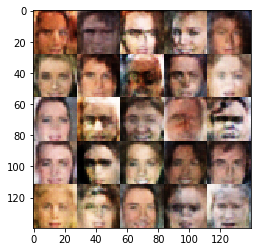

Epoch 0/1... Discriminator Loss: 0.6486... Generator Loss: 1.7211
Epoch 0/1... Discriminator Loss: 0.7765... Generator Loss: 1.3431
Epoch 0/1... Discriminator Loss: 1.2296... Generator Loss: 0.4757
Epoch 0/1... Discriminator Loss: 0.9681... Generator Loss: 0.6651
Epoch 0/1... Discriminator Loss: 0.5071... Generator Loss: 1.4632
Epoch 0/1... Discriminator Loss: 1.4170... Generator Loss: 0.3382
Epoch 0/1... Discriminator Loss: 1.3987... Generator Loss: 0.4121
Epoch 0/1... Discriminator Loss: 1.0334... Generator Loss: 0.5691
Epoch 0/1... Discriminator Loss: 1.1598... Generator Loss: 0.6347
Epoch 0/1... Discriminator Loss: 0.9254... Generator Loss: 0.8500


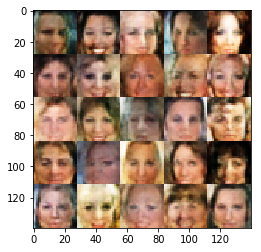

Epoch 0/1... Discriminator Loss: 0.6845... Generator Loss: 1.6467
Epoch 0/1... Discriminator Loss: 0.6964... Generator Loss: 1.2072
Epoch 0/1... Discriminator Loss: 0.6558... Generator Loss: 1.2783
Epoch 0/1... Discriminator Loss: 1.1957... Generator Loss: 1.0360
Epoch 0/1... Discriminator Loss: 0.9495... Generator Loss: 0.8095
Epoch 0/1... Discriminator Loss: 1.1892... Generator Loss: 0.5568
Epoch 0/1... Discriminator Loss: 0.6339... Generator Loss: 1.2169
Epoch 0/1... Discriminator Loss: 0.8905... Generator Loss: 0.9301
Epoch 0/1... Discriminator Loss: 0.5459... Generator Loss: 1.8401
Epoch 0/1... Discriminator Loss: 0.8252... Generator Loss: 0.9917


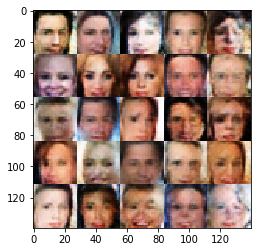

Epoch 0/1... Discriminator Loss: 1.0918... Generator Loss: 0.6836
Epoch 0/1... Discriminator Loss: 1.0178... Generator Loss: 0.6494
Epoch 0/1... Discriminator Loss: 0.8645... Generator Loss: 1.0927
Epoch 0/1... Discriminator Loss: 1.0030... Generator Loss: 0.7803
Epoch 0/1... Discriminator Loss: 0.9329... Generator Loss: 1.1230
Epoch 0/1... Discriminator Loss: 0.7613... Generator Loss: 1.0944
Epoch 0/1... Discriminator Loss: 0.4987... Generator Loss: 1.3898
Epoch 0/1... Discriminator Loss: 1.5388... Generator Loss: 0.3114
Epoch 0/1... Discriminator Loss: 0.9372... Generator Loss: 1.0219
Epoch 0/1... Discriminator Loss: 0.9078... Generator Loss: 0.8037


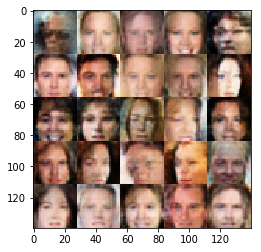

Epoch 0/1... Discriminator Loss: 0.8300... Generator Loss: 1.2975
Epoch 0/1... Discriminator Loss: 0.8347... Generator Loss: 0.8584
Epoch 0/1... Discriminator Loss: 0.7305... Generator Loss: 1.0460
Epoch 0/1... Discriminator Loss: 1.0672... Generator Loss: 1.2371
Epoch 0/1... Discriminator Loss: 1.4044... Generator Loss: 0.4625
Epoch 0/1... Discriminator Loss: 1.2896... Generator Loss: 0.6780
Epoch 0/1... Discriminator Loss: 0.9962... Generator Loss: 0.6559
Epoch 0/1... Discriminator Loss: 1.0365... Generator Loss: 0.7763
Epoch 0/1... Discriminator Loss: 1.1818... Generator Loss: 0.6666
Epoch 0/1... Discriminator Loss: 0.6775... Generator Loss: 1.4968


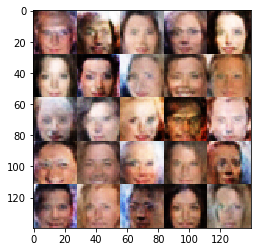

Epoch 0/1... Discriminator Loss: 0.9653... Generator Loss: 0.6903
Epoch 0/1... Discriminator Loss: 0.9880... Generator Loss: 0.8772
Epoch 0/1... Discriminator Loss: 1.1730... Generator Loss: 0.6779
Epoch 0/1... Discriminator Loss: 0.8751... Generator Loss: 1.1427
Epoch 0/1... Discriminator Loss: 0.9739... Generator Loss: 0.7538
Epoch 0/1... Discriminator Loss: 0.7461... Generator Loss: 0.8809
Epoch 0/1... Discriminator Loss: 1.0110... Generator Loss: 0.7650
Epoch 0/1... Discriminator Loss: 0.7011... Generator Loss: 1.4123
Epoch 0/1... Discriminator Loss: 1.3107... Generator Loss: 0.6091
Epoch 0/1... Discriminator Loss: 0.7732... Generator Loss: 0.9488


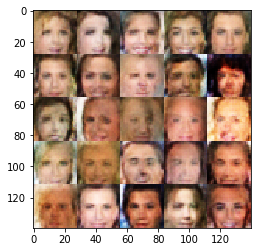

Epoch 0/1... Discriminator Loss: 0.6990... Generator Loss: 1.0946
Epoch 0/1... Discriminator Loss: 0.8843... Generator Loss: 1.0442
Epoch 0/1... Discriminator Loss: 1.0426... Generator Loss: 0.6489
Epoch 0/1... Discriminator Loss: 0.8230... Generator Loss: 1.3671
Epoch 0/1... Discriminator Loss: 1.0281... Generator Loss: 1.2930
Epoch 0/1... Discriminator Loss: 1.1533... Generator Loss: 0.5966
Epoch 0/1... Discriminator Loss: 0.9205... Generator Loss: 0.8488
Epoch 0/1... Discriminator Loss: 0.9283... Generator Loss: 0.8002
Epoch 0/1... Discriminator Loss: 0.9035... Generator Loss: 0.8460
Epoch 0/1... Discriminator Loss: 1.0282... Generator Loss: 0.5973


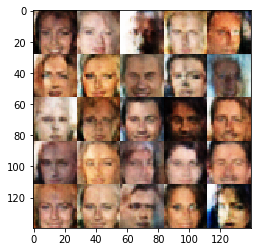

Epoch 0/1... Discriminator Loss: 0.8590... Generator Loss: 0.8998
Epoch 0/1... Discriminator Loss: 0.7083... Generator Loss: 1.1048
Epoch 0/1... Discriminator Loss: 1.1449... Generator Loss: 0.5300
Epoch 0/1... Discriminator Loss: 0.7985... Generator Loss: 0.9814
Epoch 0/1... Discriminator Loss: 0.8606... Generator Loss: 1.0178
Epoch 0/1... Discriminator Loss: 0.7642... Generator Loss: 1.3132
Epoch 0/1... Discriminator Loss: 0.8844... Generator Loss: 0.9259
Epoch 0/1... Discriminator Loss: 1.2753... Generator Loss: 0.5614
Epoch 0/1... Discriminator Loss: 0.7352... Generator Loss: 1.3140
Epoch 0/1... Discriminator Loss: 1.1111... Generator Loss: 0.6360


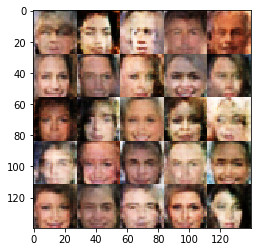

Epoch 0/1... Discriminator Loss: 0.7639... Generator Loss: 1.6422
Epoch 0/1... Discriminator Loss: 0.9790... Generator Loss: 1.1287
Epoch 0/1... Discriminator Loss: 1.4282... Generator Loss: 0.4289
Epoch 0/1... Discriminator Loss: 0.9253... Generator Loss: 0.8007
Epoch 0/1... Discriminator Loss: 0.8341... Generator Loss: 1.3520
Epoch 0/1... Discriminator Loss: 1.0561... Generator Loss: 0.5867
Epoch 0/1... Discriminator Loss: 0.9491... Generator Loss: 0.7869
Epoch 0/1... Discriminator Loss: 0.6390... Generator Loss: 1.4649
Epoch 0/1... Discriminator Loss: 0.7907... Generator Loss: 1.1745
Epoch 0/1... Discriminator Loss: 0.9659... Generator Loss: 1.7701


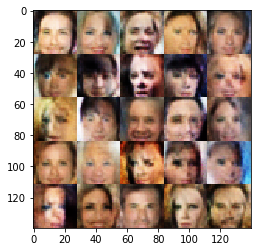

Epoch 0/1... Discriminator Loss: 0.7001... Generator Loss: 0.9957
Epoch 0/1... Discriminator Loss: 1.0565... Generator Loss: 0.5986
Epoch 0/1... Discriminator Loss: 0.8790... Generator Loss: 0.9161
Epoch 0/1... Discriminator Loss: 0.7817... Generator Loss: 1.1161
Epoch 0/1... Discriminator Loss: 1.0697... Generator Loss: 1.5019
Epoch 0/1... Discriminator Loss: 1.0170... Generator Loss: 0.6971
Epoch 0/1... Discriminator Loss: 0.7516... Generator Loss: 0.8799
Epoch 0/1... Discriminator Loss: 0.7378... Generator Loss: 1.5210
Epoch 0/1... Discriminator Loss: 1.0285... Generator Loss: 0.6170
Epoch 0/1... Discriminator Loss: 1.0765... Generator Loss: 0.6374


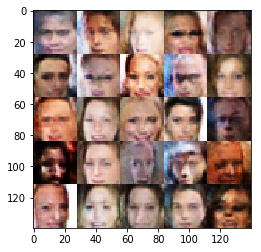

Epoch 0/1... Discriminator Loss: 0.4680... Generator Loss: 1.6633
Epoch 0/1... Discriminator Loss: 1.0085... Generator Loss: 0.6150
Epoch 0/1... Discriminator Loss: 0.8884... Generator Loss: 0.7903
Epoch 0/1... Discriminator Loss: 0.7409... Generator Loss: 1.1921
Epoch 0/1... Discriminator Loss: 0.8687... Generator Loss: 0.9829
Epoch 0/1... Discriminator Loss: 0.7504... Generator Loss: 0.9483
Epoch 0/1... Discriminator Loss: 0.5573... Generator Loss: 1.7827
Epoch 0/1... Discriminator Loss: 1.1559... Generator Loss: 0.5379
Epoch 0/1... Discriminator Loss: 0.8986... Generator Loss: 0.6878
Epoch 0/1... Discriminator Loss: 0.8855... Generator Loss: 0.7190


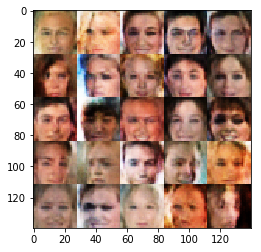

Epoch 0/1... Discriminator Loss: 1.1602... Generator Loss: 0.6759
Epoch 0/1... Discriminator Loss: 2.0619... Generator Loss: 0.1749
Epoch 0/1... Discriminator Loss: 1.0156... Generator Loss: 0.7964
Epoch 0/1... Discriminator Loss: 1.1975... Generator Loss: 0.6232
Epoch 0/1... Discriminator Loss: 1.1502... Generator Loss: 0.9711
Epoch 0/1... Discriminator Loss: 1.0841... Generator Loss: 0.6096
Epoch 0/1... Discriminator Loss: 0.9740... Generator Loss: 0.9476
Epoch 0/1... Discriminator Loss: 0.8080... Generator Loss: 0.7277
Epoch 0/1... Discriminator Loss: 1.1131... Generator Loss: 0.5599
Epoch 0/1... Discriminator Loss: 0.6691... Generator Loss: 1.3485


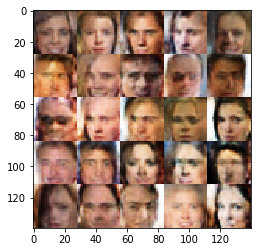

Epoch 0/1... Discriminator Loss: 1.0788... Generator Loss: 0.6286
Epoch 0/1... Discriminator Loss: 0.9928... Generator Loss: 1.0098
Epoch 0/1... Discriminator Loss: 1.4652... Generator Loss: 0.3787
Epoch 0/1... Discriminator Loss: 0.8438... Generator Loss: 0.9109
Epoch 0/1... Discriminator Loss: 0.9389... Generator Loss: 0.9308
Epoch 0/1... Discriminator Loss: 0.4171... Generator Loss: 1.4779
Epoch 0/1... Discriminator Loss: 0.5490... Generator Loss: 1.1342
Epoch 0/1... Discriminator Loss: 1.8167... Generator Loss: 0.2711
Epoch 0/1... Discriminator Loss: 0.7299... Generator Loss: 1.3882
Epoch 0/1... Discriminator Loss: 0.6656... Generator Loss: 1.3125


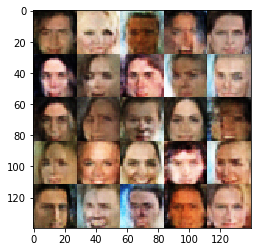

Epoch 0/1... Discriminator Loss: 1.1277... Generator Loss: 1.1762
Epoch 0/1... Discriminator Loss: 1.0236... Generator Loss: 0.6424
Epoch 0/1... Discriminator Loss: 0.5416... Generator Loss: 1.2167
Epoch 0/1... Discriminator Loss: 0.7366... Generator Loss: 1.2106
Epoch 0/1... Discriminator Loss: 1.0505... Generator Loss: 0.6078
Epoch 0/1... Discriminator Loss: 0.9657... Generator Loss: 0.7495
Epoch 0/1... Discriminator Loss: 1.2421... Generator Loss: 0.4712
Epoch 0/1... Discriminator Loss: 1.0307... Generator Loss: 0.6272
Epoch 0/1... Discriminator Loss: 0.5851... Generator Loss: 1.1042
Epoch 0/1... Discriminator Loss: 0.4371... Generator Loss: 1.4808


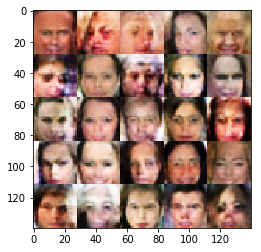

Epoch 0/1... Discriminator Loss: 0.8819... Generator Loss: 1.1595
Epoch 0/1... Discriminator Loss: 0.7600... Generator Loss: 2.1396
Epoch 0/1... Discriminator Loss: 0.9340... Generator Loss: 0.7789
Epoch 0/1... Discriminator Loss: 0.8215... Generator Loss: 0.9848
Epoch 0/1... Discriminator Loss: 0.8851... Generator Loss: 0.9248
Epoch 0/1... Discriminator Loss: 0.8879... Generator Loss: 0.7850
Epoch 0/1... Discriminator Loss: 1.1189... Generator Loss: 0.6025
Epoch 0/1... Discriminator Loss: 1.0506... Generator Loss: 0.6897
Epoch 0/1... Discriminator Loss: 0.9746... Generator Loss: 0.6822
Epoch 0/1... Discriminator Loss: 0.6442... Generator Loss: 1.0708


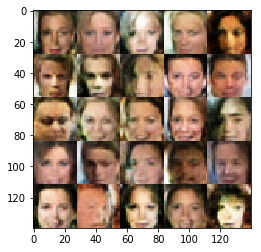

Epoch 0/1... Discriminator Loss: 0.8562... Generator Loss: 0.6981
Epoch 0/1... Discriminator Loss: 1.1009... Generator Loss: 0.5476
Epoch 0/1... Discriminator Loss: 0.8494... Generator Loss: 1.1156
Epoch 0/1... Discriminator Loss: 0.7143... Generator Loss: 1.1192
Epoch 0/1... Discriminator Loss: 0.7041... Generator Loss: 1.2028
Epoch 0/1... Discriminator Loss: 0.7990... Generator Loss: 1.1094
Epoch 0/1... Discriminator Loss: 1.3287... Generator Loss: 0.5540
Epoch 0/1... Discriminator Loss: 1.0626... Generator Loss: 1.1538
Epoch 0/1... Discriminator Loss: 0.8286... Generator Loss: 0.8823
Epoch 0/1... Discriminator Loss: 0.9559... Generator Loss: 0.7648


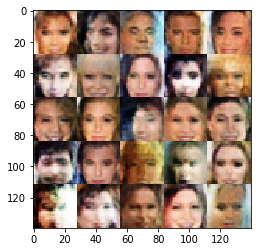

Epoch 0/1... Discriminator Loss: 0.6521... Generator Loss: 1.2014
Epoch 0/1... Discriminator Loss: 0.4443... Generator Loss: 1.7670
Epoch 0/1... Discriminator Loss: 0.5728... Generator Loss: 1.7707
Epoch 0/1... Discriminator Loss: 1.0895... Generator Loss: 0.6347
Epoch 0/1... Discriminator Loss: 0.8603... Generator Loss: 0.8810
Epoch 0/1... Discriminator Loss: 0.3775... Generator Loss: 2.0447
Epoch 0/1... Discriminator Loss: 0.8391... Generator Loss: 1.6574
Epoch 0/1... Discriminator Loss: 0.8058... Generator Loss: 1.0123
Epoch 0/1... Discriminator Loss: 0.9328... Generator Loss: 0.6862
Epoch 0/1... Discriminator Loss: 0.4986... Generator Loss: 1.6822


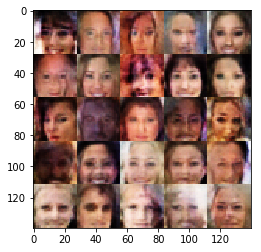

Epoch 0/1... Discriminator Loss: 0.9033... Generator Loss: 0.8841
Epoch 0/1... Discriminator Loss: 0.4742... Generator Loss: 1.4100
Epoch 0/1... Discriminator Loss: 0.9361... Generator Loss: 0.6994
Epoch 0/1... Discriminator Loss: 1.1700... Generator Loss: 1.4804
Epoch 0/1... Discriminator Loss: 0.9239... Generator Loss: 0.8305
Epoch 0/1... Discriminator Loss: 0.9045... Generator Loss: 0.9033
Epoch 0/1... Discriminator Loss: 1.1405... Generator Loss: 0.5521
Epoch 0/1... Discriminator Loss: 0.5287... Generator Loss: 1.6766
Epoch 0/1... Discriminator Loss: 0.8091... Generator Loss: 1.0426
Epoch 0/1... Discriminator Loss: 1.1224... Generator Loss: 0.6787


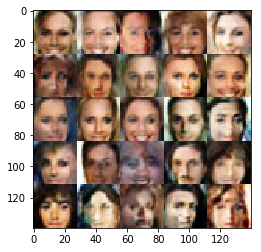

Epoch 0/1... Discriminator Loss: 0.7710... Generator Loss: 1.0552
Epoch 0/1... Discriminator Loss: 0.9597... Generator Loss: 0.7468
Epoch 0/1... Discriminator Loss: 0.8405... Generator Loss: 1.1222
Epoch 0/1... Discriminator Loss: 0.7228... Generator Loss: 1.2866
Epoch 0/1... Discriminator Loss: 0.3928... Generator Loss: 1.9296
Epoch 0/1... Discriminator Loss: 0.8087... Generator Loss: 0.9607
Epoch 0/1... Discriminator Loss: 1.0259... Generator Loss: 0.8236
Epoch 0/1... Discriminator Loss: 0.6752... Generator Loss: 1.4399
Epoch 0/1... Discriminator Loss: 0.9680... Generator Loss: 0.9764
Epoch 0/1... Discriminator Loss: 0.9310... Generator Loss: 0.7301


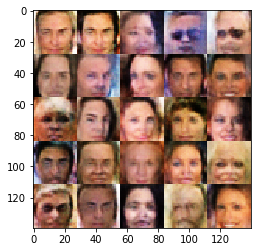

Epoch 0/1... Discriminator Loss: 0.8829... Generator Loss: 0.8712
Epoch 0/1... Discriminator Loss: 0.6793... Generator Loss: 1.2838
Epoch 0/1... Discriminator Loss: 0.8494... Generator Loss: 1.3427
Epoch 0/1... Discriminator Loss: 0.6103... Generator Loss: 1.2080
Epoch 0/1... Discriminator Loss: 0.6479... Generator Loss: 1.3623
Epoch 0/1... Discriminator Loss: 0.8236... Generator Loss: 0.9531
Epoch 0/1... Discriminator Loss: 0.5768... Generator Loss: 1.3767
Epoch 0/1... Discriminator Loss: 0.5427... Generator Loss: 1.3592
Epoch 0/1... Discriminator Loss: 1.0117... Generator Loss: 0.7857
Epoch 0/1... Discriminator Loss: 0.5640... Generator Loss: 1.2658


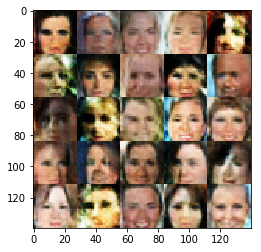

Epoch 0/1... Discriminator Loss: 1.1000... Generator Loss: 0.7453
Epoch 0/1... Discriminator Loss: 0.9645... Generator Loss: 0.7465
Epoch 0/1... Discriminator Loss: 0.8623... Generator Loss: 1.1489
Epoch 0/1... Discriminator Loss: 0.7569... Generator Loss: 1.2184
Epoch 0/1... Discriminator Loss: 0.6562... Generator Loss: 1.1059
Epoch 0/1... Discriminator Loss: 0.7148... Generator Loss: 1.1289
Epoch 0/1... Discriminator Loss: 1.0952... Generator Loss: 0.5165
Epoch 0/1... Discriminator Loss: 1.0762... Generator Loss: 0.7289
Epoch 0/1... Discriminator Loss: 0.7907... Generator Loss: 0.9251
Epoch 0/1... Discriminator Loss: 1.0429... Generator Loss: 0.6264


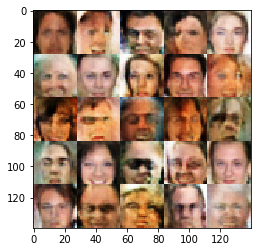

Epoch 0/1... Discriminator Loss: 1.1225... Generator Loss: 0.9343
Epoch 0/1... Discriminator Loss: 0.6918... Generator Loss: 1.4730
Epoch 0/1... Discriminator Loss: 0.8447... Generator Loss: 1.1300
Epoch 0/1... Discriminator Loss: 1.2939... Generator Loss: 0.4676
Epoch 0/1... Discriminator Loss: 0.7316... Generator Loss: 1.1340
Epoch 0/1... Discriminator Loss: 1.2569... Generator Loss: 0.4952
Epoch 0/1... Discriminator Loss: 1.3505... Generator Loss: 0.4478
Epoch 0/1... Discriminator Loss: 0.8340... Generator Loss: 0.7168
Epoch 0/1... Discriminator Loss: 0.9075... Generator Loss: 0.7466
Epoch 0/1... Discriminator Loss: 1.9922... Generator Loss: 0.2121


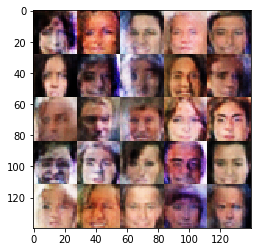

Epoch 0/1... Discriminator Loss: 0.9654... Generator Loss: 0.7471
Epoch 0/1... Discriminator Loss: 0.9830... Generator Loss: 0.5816
Epoch 0/1... Discriminator Loss: 1.1968... Generator Loss: 0.6303
Epoch 0/1... Discriminator Loss: 1.1945... Generator Loss: 0.5610
Epoch 0/1... Discriminator Loss: 0.7289... Generator Loss: 1.0401
Epoch 0/1... Discriminator Loss: 0.5490... Generator Loss: 1.3230
Epoch 0/1... Discriminator Loss: 0.5957... Generator Loss: 1.3605
Epoch 0/1... Discriminator Loss: 0.7660... Generator Loss: 1.0148
Epoch 0/1... Discriminator Loss: 0.6435... Generator Loss: 2.1625
Epoch 0/1... Discriminator Loss: 0.5616... Generator Loss: 1.5718


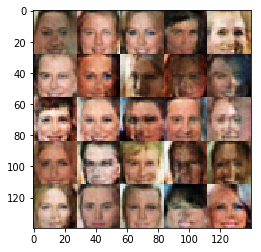

Epoch 0/1... Discriminator Loss: 1.5203... Generator Loss: 0.3330
Epoch 0/1... Discriminator Loss: 0.7943... Generator Loss: 1.4475
Epoch 0/1... Discriminator Loss: 1.0112... Generator Loss: 0.7133
Epoch 0/1... Discriminator Loss: 0.9967... Generator Loss: 0.6779
Epoch 0/1... Discriminator Loss: 0.8703... Generator Loss: 1.0933
Epoch 0/1... Discriminator Loss: 0.6990... Generator Loss: 1.2381
Epoch 0/1... Discriminator Loss: 1.1691... Generator Loss: 0.6049
Epoch 0/1... Discriminator Loss: 1.0243... Generator Loss: 0.8193
Epoch 0/1... Discriminator Loss: 0.6085... Generator Loss: 1.2955
Epoch 0/1... Discriminator Loss: 0.7989... Generator Loss: 0.8168


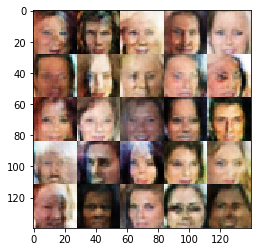

Epoch 0/1... Discriminator Loss: 1.6985... Generator Loss: 0.2469
Epoch 0/1... Discriminator Loss: 1.1501... Generator Loss: 2.3291
Epoch 0/1... Discriminator Loss: 1.1172... Generator Loss: 0.6954
Epoch 0/1... Discriminator Loss: 0.8760... Generator Loss: 1.8977
Epoch 0/1... Discriminator Loss: 1.2692... Generator Loss: 0.5357
Epoch 0/1... Discriminator Loss: 0.3578... Generator Loss: 1.6178
Epoch 0/1... Discriminator Loss: 0.9520... Generator Loss: 0.7572
Epoch 0/1... Discriminator Loss: 1.3495... Generator Loss: 0.4493
Epoch 0/1... Discriminator Loss: 0.7205... Generator Loss: 1.0719
Epoch 0/1... Discriminator Loss: 0.6826... Generator Loss: 1.2329


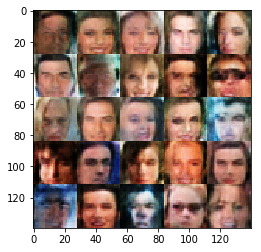

Epoch 0/1... Discriminator Loss: 0.7738... Generator Loss: 0.9107
Epoch 0/1... Discriminator Loss: 1.3651... Generator Loss: 0.4030
Epoch 0/1... Discriminator Loss: 0.9852... Generator Loss: 0.7435
Epoch 0/1... Discriminator Loss: 0.9150... Generator Loss: 0.9874
Epoch 0/1... Discriminator Loss: 0.9406... Generator Loss: 0.7631
Epoch 0/1... Discriminator Loss: 0.9778... Generator Loss: 0.7965
Epoch 0/1... Discriminator Loss: 0.7073... Generator Loss: 1.3374
Epoch 0/1... Discriminator Loss: 1.0513... Generator Loss: 0.7007
Epoch 0/1... Discriminator Loss: 0.9838... Generator Loss: 0.6623
Epoch 0/1... Discriminator Loss: 0.7221... Generator Loss: 0.9167


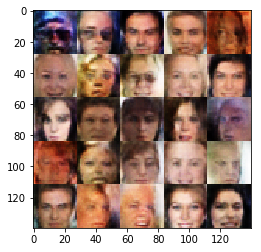

Epoch 0/1... Discriminator Loss: 0.7696... Generator Loss: 1.1309
Epoch 0/1... Discriminator Loss: 0.6814... Generator Loss: 0.9478
Epoch 0/1... Discriminator Loss: 0.6234... Generator Loss: 1.2037
Epoch 0/1... Discriminator Loss: 0.6924... Generator Loss: 1.7441
Epoch 0/1... Discriminator Loss: 0.8114... Generator Loss: 1.1153
Epoch 0/1... Discriminator Loss: 1.3548... Generator Loss: 0.4603
Epoch 0/1... Discriminator Loss: 1.0329... Generator Loss: 0.6761
Epoch 0/1... Discriminator Loss: 0.9914... Generator Loss: 0.8351
Epoch 0/1... Discriminator Loss: 0.6914... Generator Loss: 0.8967
Epoch 0/1... Discriminator Loss: 1.5260... Generator Loss: 0.4019


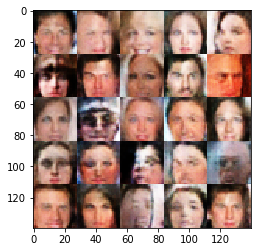

Epoch 0/1... Discriminator Loss: 0.7019... Generator Loss: 1.3126
Epoch 0/1... Discriminator Loss: 0.8512... Generator Loss: 0.8063
Epoch 0/1... Discriminator Loss: 0.9659... Generator Loss: 0.9715
Epoch 0/1... Discriminator Loss: 0.6399... Generator Loss: 1.3447
Epoch 0/1... Discriminator Loss: 1.0245... Generator Loss: 1.0766
Epoch 0/1... Discriminator Loss: 0.5927... Generator Loss: 1.1759
Epoch 0/1... Discriminator Loss: 0.5984... Generator Loss: 1.0838
Epoch 0/1... Discriminator Loss: 0.7943... Generator Loss: 0.8652
Epoch 0/1... Discriminator Loss: 1.3606... Generator Loss: 0.7721
Epoch 0/1... Discriminator Loss: 0.8030... Generator Loss: 1.0804


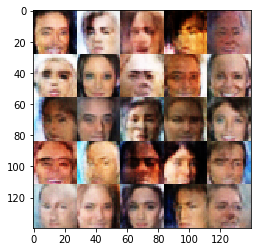

Epoch 0/1... Discriminator Loss: 1.3103... Generator Loss: 0.6708
Epoch 0/1... Discriminator Loss: 0.7008... Generator Loss: 1.0624
Epoch 0/1... Discriminator Loss: 0.6566... Generator Loss: 1.2612
Epoch 0/1... Discriminator Loss: 0.7001... Generator Loss: 1.3995
Epoch 0/1... Discriminator Loss: 0.9617... Generator Loss: 0.7067
Epoch 0/1... Discriminator Loss: 0.5402... Generator Loss: 1.4225
Epoch 0/1... Discriminator Loss: 0.7359... Generator Loss: 1.1414
Epoch 0/1... Discriminator Loss: 0.9089... Generator Loss: 1.2887
Epoch 0/1... Discriminator Loss: 1.2601... Generator Loss: 0.5147
Epoch 0/1... Discriminator Loss: 0.5642... Generator Loss: 1.1990


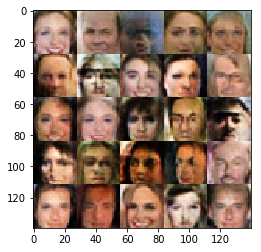

Epoch 0/1... Discriminator Loss: 0.7026... Generator Loss: 1.9212
Epoch 0/1... Discriminator Loss: 1.2206... Generator Loss: 0.5517
Epoch 0/1... Discriminator Loss: 0.4671... Generator Loss: 1.4820
Epoch 0/1... Discriminator Loss: 0.6899... Generator Loss: 1.2121
Epoch 0/1... Discriminator Loss: 0.7063... Generator Loss: 1.1467
Epoch 0/1... Discriminator Loss: 0.6436... Generator Loss: 1.0866
Epoch 0/1... Discriminator Loss: 0.6512... Generator Loss: 1.2072
Epoch 0/1... Discriminator Loss: 1.0945... Generator Loss: 0.6051
Epoch 0/1... Discriminator Loss: 0.5932... Generator Loss: 1.7854
Epoch 0/1... Discriminator Loss: 0.7087... Generator Loss: 1.3159


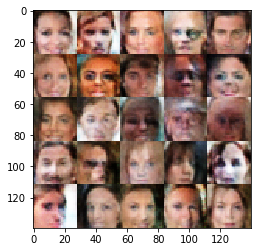

Epoch 0/1... Discriminator Loss: 1.0387... Generator Loss: 0.6912
Epoch 0/1... Discriminator Loss: 0.5315... Generator Loss: 1.5151
Epoch 0/1... Discriminator Loss: 0.5348... Generator Loss: 1.1987
Epoch 0/1... Discriminator Loss: 0.6792... Generator Loss: 1.1015
Epoch 0/1... Discriminator Loss: 0.8159... Generator Loss: 1.2018
Epoch 0/1... Discriminator Loss: 0.9889... Generator Loss: 0.8135
Epoch 0/1... Discriminator Loss: 0.3903... Generator Loss: 1.7775
Epoch 0/1... Discriminator Loss: 0.9103... Generator Loss: 0.8888
Epoch 0/1... Discriminator Loss: 0.7949... Generator Loss: 1.0368
Epoch 0/1... Discriminator Loss: 0.9159... Generator Loss: 1.3022


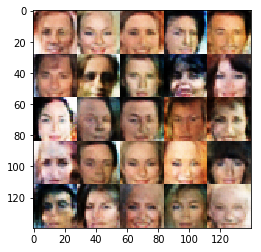

Epoch 0/1... Discriminator Loss: 1.1751... Generator Loss: 0.5056
Epoch 0/1... Discriminator Loss: 0.9811... Generator Loss: 0.6455
Epoch 0/1... Discriminator Loss: 1.0031... Generator Loss: 0.8172
Epoch 0/1... Discriminator Loss: 1.4956... Generator Loss: 0.3731
Epoch 0/1... Discriminator Loss: 0.5877... Generator Loss: 1.3197
Epoch 0/1... Discriminator Loss: 0.5857... Generator Loss: 1.8842
Epoch 0/1... Discriminator Loss: 0.4964... Generator Loss: 1.1547
Epoch 0/1... Discriminator Loss: 1.1118... Generator Loss: 0.7533
Epoch 0/1... Discriminator Loss: 1.2118... Generator Loss: 0.5482
Epoch 0/1... Discriminator Loss: 0.6367... Generator Loss: 1.5048


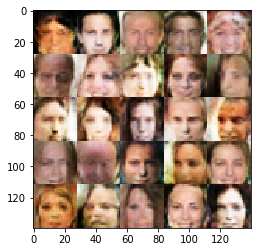

Epoch 0/1... Discriminator Loss: 1.5321... Generator Loss: 0.3461
Epoch 0/1... Discriminator Loss: 0.9552... Generator Loss: 0.6893
Epoch 0/1... Discriminator Loss: 0.8128... Generator Loss: 0.9424
Epoch 0/1... Discriminator Loss: 1.2274... Generator Loss: 0.5127
Epoch 0/1... Discriminator Loss: 0.6677... Generator Loss: 0.9665
Epoch 0/1... Discriminator Loss: 1.0095... Generator Loss: 1.1714
Epoch 0/1... Discriminator Loss: 0.6752... Generator Loss: 1.1626
Epoch 0/1... Discriminator Loss: 0.6776... Generator Loss: 1.9931
Epoch 0/1... Discriminator Loss: 0.9501... Generator Loss: 0.7400
Epoch 0/1... Discriminator Loss: 1.6152... Generator Loss: 0.2961


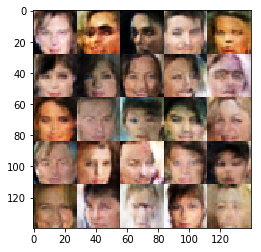

Epoch 0/1... Discriminator Loss: 0.5896... Generator Loss: 1.4100
Epoch 0/1... Discriminator Loss: 1.1800... Generator Loss: 0.5695
Epoch 0/1... Discriminator Loss: 0.7842... Generator Loss: 0.9635
Epoch 0/1... Discriminator Loss: 0.8903... Generator Loss: 0.7936
Epoch 0/1... Discriminator Loss: 0.7128... Generator Loss: 1.1335
Epoch 0/1... Discriminator Loss: 1.2970... Generator Loss: 0.5216
Epoch 0/1... Discriminator Loss: 0.7279... Generator Loss: 1.2024
Epoch 0/1... Discriminator Loss: 0.7078... Generator Loss: 1.1642
Epoch 0/1... Discriminator Loss: 0.9677... Generator Loss: 0.8051
Epoch 0/1... Discriminator Loss: 0.8199... Generator Loss: 0.9845


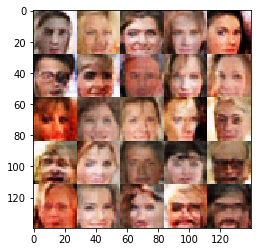

Epoch 0/1... Discriminator Loss: 0.9105... Generator Loss: 0.6750
Epoch 0/1... Discriminator Loss: 0.9796... Generator Loss: 0.7293
Epoch 0/1... Discriminator Loss: 1.3561... Generator Loss: 0.3412
Epoch 0/1... Discriminator Loss: 0.5935... Generator Loss: 1.1896
Epoch 0/1... Discriminator Loss: 1.0878... Generator Loss: 0.5358
Epoch 0/1... Discriminator Loss: 0.9246... Generator Loss: 0.8576
Epoch 0/1... Discriminator Loss: 1.0480... Generator Loss: 0.6616
Epoch 0/1... Discriminator Loss: 0.9598... Generator Loss: 0.5835
Epoch 0/1... Discriminator Loss: 1.1306... Generator Loss: 0.4664
Epoch 0/1... Discriminator Loss: 0.4781... Generator Loss: 1.5550


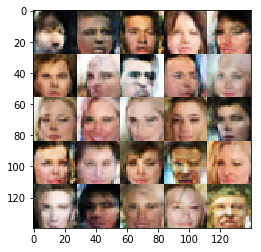

Epoch 0/1... Discriminator Loss: 0.6268... Generator Loss: 1.0165
Epoch 0/1... Discriminator Loss: 0.6102... Generator Loss: 1.1679
Epoch 0/1... Discriminator Loss: 0.4537... Generator Loss: 1.4071
Epoch 0/1... Discriminator Loss: 0.9801... Generator Loss: 1.1735
Epoch 0/1... Discriminator Loss: 0.7494... Generator Loss: 1.3339
Epoch 0/1... Discriminator Loss: 1.0532... Generator Loss: 0.9575
Epoch 0/1... Discriminator Loss: 0.9446... Generator Loss: 1.3203
Epoch 0/1... Discriminator Loss: 0.7794... Generator Loss: 0.8770
Epoch 0/1... Discriminator Loss: 0.9950... Generator Loss: 0.6101
Epoch 0/1... Discriminator Loss: 0.7947... Generator Loss: 0.9088


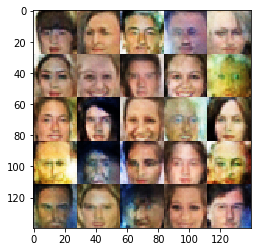

Epoch 0/1... Discriminator Loss: 1.3923... Generator Loss: 0.4198
Epoch 0/1... Discriminator Loss: 1.1089... Generator Loss: 0.6904
Epoch 0/1... Discriminator Loss: 0.5747... Generator Loss: 1.2803
Epoch 0/1... Discriminator Loss: 0.7843... Generator Loss: 1.0301
Epoch 0/1... Discriminator Loss: 0.8199... Generator Loss: 0.8800
Epoch 0/1... Discriminator Loss: 1.2730... Generator Loss: 0.4333
Epoch 0/1... Discriminator Loss: 1.0805... Generator Loss: 0.5686
Epoch 0/1... Discriminator Loss: 1.1438... Generator Loss: 0.6549
Epoch 0/1... Discriminator Loss: 0.7623... Generator Loss: 1.7462
Epoch 0/1... Discriminator Loss: 0.9002... Generator Loss: 0.7493


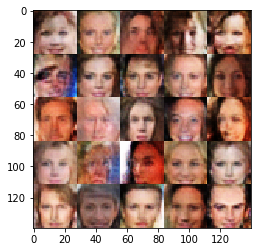

Epoch 0/1... Discriminator Loss: 0.8948... Generator Loss: 0.8634
Epoch 0/1... Discriminator Loss: 0.6620... Generator Loss: 1.1288
Epoch 0/1... Discriminator Loss: 0.5836... Generator Loss: 1.2929
Epoch 0/1... Discriminator Loss: 0.6313... Generator Loss: 1.1309
Epoch 0/1... Discriminator Loss: 1.2507... Generator Loss: 1.4184
Epoch 0/1... Discriminator Loss: 1.1322... Generator Loss: 0.5509
Epoch 0/1... Discriminator Loss: 0.6111... Generator Loss: 1.5370
Epoch 0/1... Discriminator Loss: 0.6560... Generator Loss: 1.6074
Epoch 0/1... Discriminator Loss: 0.7198... Generator Loss: 0.9929
Epoch 0/1... Discriminator Loss: 0.7482... Generator Loss: 1.1158


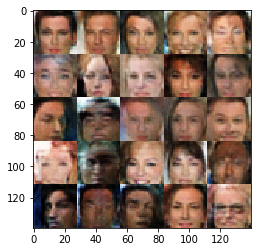

Epoch 0/1... Discriminator Loss: 0.7063... Generator Loss: 1.2717
Epoch 0/1... Discriminator Loss: 1.0542... Generator Loss: 0.5862
Epoch 0/1... Discriminator Loss: 0.6703... Generator Loss: 1.1071
Epoch 0/1... Discriminator Loss: 0.9904... Generator Loss: 0.7708
Epoch 0/1... Discriminator Loss: 0.9430... Generator Loss: 0.7432
Epoch 0/1... Discriminator Loss: 0.7102... Generator Loss: 1.0797
Epoch 0/1... Discriminator Loss: 0.6064... Generator Loss: 1.5065
Epoch 0/1... Discriminator Loss: 0.7830... Generator Loss: 1.0797
Epoch 0/1... Discriminator Loss: 0.6866... Generator Loss: 1.0795
Epoch 0/1... Discriminator Loss: 1.0588... Generator Loss: 0.6119


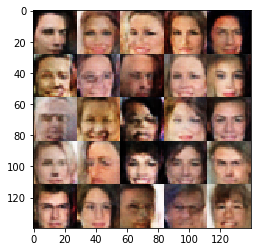

Epoch 0/1... Discriminator Loss: 0.6510... Generator Loss: 1.0313
Epoch 0/1... Discriminator Loss: 0.6080... Generator Loss: 1.5124
Epoch 0/1... Discriminator Loss: 1.1405... Generator Loss: 1.7935
Epoch 0/1... Discriminator Loss: 0.4891... Generator Loss: 1.3585
Epoch 0/1... Discriminator Loss: 0.4935... Generator Loss: 1.5819
Epoch 0/1... Discriminator Loss: 0.7277... Generator Loss: 0.8885
Epoch 0/1... Discriminator Loss: 1.1030... Generator Loss: 0.6059
Epoch 0/1... Discriminator Loss: 0.9787... Generator Loss: 0.6717
Epoch 0/1... Discriminator Loss: 1.1392... Generator Loss: 0.6011
Epoch 0/1... Discriminator Loss: 0.8114... Generator Loss: 0.9163


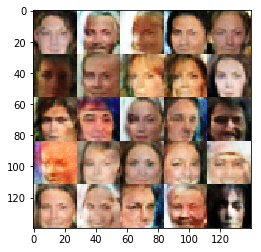

Epoch 0/1... Discriminator Loss: 1.1356... Generator Loss: 0.4863
Epoch 0/1... Discriminator Loss: 0.9217... Generator Loss: 0.9179
Epoch 0/1... Discriminator Loss: 0.6849... Generator Loss: 1.3840
Epoch 0/1... Discriminator Loss: 0.5752... Generator Loss: 1.2541
Epoch 0/1... Discriminator Loss: 0.6139... Generator Loss: 1.4286
Epoch 0/1... Discriminator Loss: 0.8184... Generator Loss: 0.9777
Epoch 0/1... Discriminator Loss: 1.1181... Generator Loss: 0.5172
Epoch 0/1... Discriminator Loss: 1.1330... Generator Loss: 0.8406
Epoch 0/1... Discriminator Loss: 0.6613... Generator Loss: 1.4443
Epoch 0/1... Discriminator Loss: 0.8613... Generator Loss: 0.8108


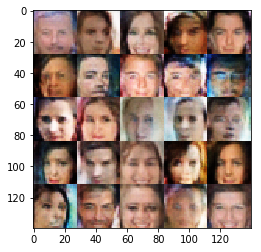

Epoch 0/1... Discriminator Loss: 0.7101... Generator Loss: 1.3196
Epoch 0/1... Discriminator Loss: 0.4428... Generator Loss: 2.5205
Epoch 0/1... Discriminator Loss: 0.7039... Generator Loss: 1.0545
Epoch 0/1... Discriminator Loss: 1.1123... Generator Loss: 0.6127
Epoch 0/1... Discriminator Loss: 0.4703... Generator Loss: 1.7328
Epoch 0/1... Discriminator Loss: 0.8505... Generator Loss: 0.8470
Epoch 0/1... Discriminator Loss: 0.8555... Generator Loss: 0.8296
Epoch 0/1... Discriminator Loss: 1.1523... Generator Loss: 0.6981
Epoch 0/1... Discriminator Loss: 0.6638... Generator Loss: 1.6282
Epoch 0/1... Discriminator Loss: 0.8812... Generator Loss: 0.7543


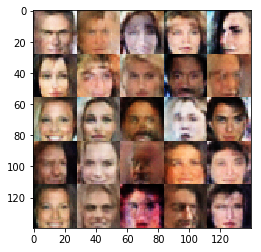

Epoch 0/1... Discriminator Loss: 0.7499... Generator Loss: 1.2540
Epoch 0/1... Discriminator Loss: 0.8307... Generator Loss: 1.3953
Epoch 0/1... Discriminator Loss: 0.7033... Generator Loss: 1.4247
Epoch 0/1... Discriminator Loss: 0.7904... Generator Loss: 0.8877
Epoch 0/1... Discriminator Loss: 1.1357... Generator Loss: 0.6017
Epoch 0/1... Discriminator Loss: 0.7105... Generator Loss: 1.0623
Epoch 0/1... Discriminator Loss: 1.3636... Generator Loss: 0.4679
Epoch 0/1... Discriminator Loss: 0.7873... Generator Loss: 0.9258
Epoch 0/1... Discriminator Loss: 1.0762... Generator Loss: 0.5370
Epoch 0/1... Discriminator Loss: 0.7825... Generator Loss: 0.9720


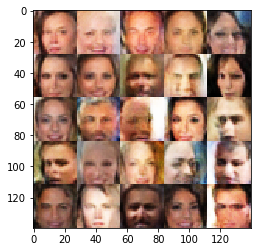

Epoch 0/1... Discriminator Loss: 0.9706... Generator Loss: 0.5761
Epoch 0/1... Discriminator Loss: 0.8372... Generator Loss: 1.1038
Epoch 0/1... Discriminator Loss: 0.3419... Generator Loss: 2.2156
Epoch 0/1... Discriminator Loss: 0.9982... Generator Loss: 0.6230
Epoch 0/1... Discriminator Loss: 1.1007... Generator Loss: 0.5223
Epoch 0/1... Discriminator Loss: 0.5980... Generator Loss: 1.3868
Epoch 0/1... Discriminator Loss: 0.4914... Generator Loss: 1.4068
Epoch 0/1... Discriminator Loss: 0.8123... Generator Loss: 0.8651
Epoch 0/1... Discriminator Loss: 0.7318... Generator Loss: 1.3855
Epoch 0/1... Discriminator Loss: 1.4236... Generator Loss: 0.4733


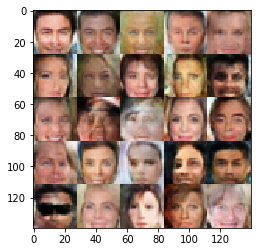

Epoch 0/1... Discriminator Loss: 0.9015... Generator Loss: 1.0017
Epoch 0/1... Discriminator Loss: 0.5882... Generator Loss: 1.2688
Epoch 0/1... Discriminator Loss: 0.4191... Generator Loss: 1.5131
Epoch 0/1... Discriminator Loss: 0.7685... Generator Loss: 1.7479
Epoch 0/1... Discriminator Loss: 1.0764... Generator Loss: 0.5883
Epoch 0/1... Discriminator Loss: 0.6061... Generator Loss: 1.1200
Epoch 0/1... Discriminator Loss: 0.7345... Generator Loss: 1.1419
Epoch 0/1... Discriminator Loss: 0.8571... Generator Loss: 0.8569
Epoch 0/1... Discriminator Loss: 1.1993... Generator Loss: 0.4928
Epoch 0/1... Discriminator Loss: 0.7505... Generator Loss: 1.1195


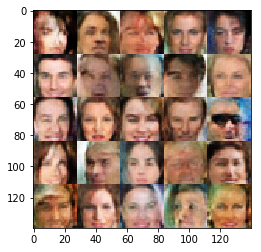

Epoch 0/1... Discriminator Loss: 1.0826... Generator Loss: 0.8109
Epoch 0/1... Discriminator Loss: 1.0261... Generator Loss: 0.6454
Epoch 0/1... Discriminator Loss: 0.3215... Generator Loss: 1.7711
Epoch 0/1... Discriminator Loss: 0.8949... Generator Loss: 0.8558
Epoch 0/1... Discriminator Loss: 0.6037... Generator Loss: 1.1506
Epoch 0/1... Discriminator Loss: 1.3550... Generator Loss: 0.5385
Epoch 0/1... Discriminator Loss: 0.7857... Generator Loss: 1.0039
Epoch 0/1... Discriminator Loss: 1.0750... Generator Loss: 0.6021
Epoch 0/1... Discriminator Loss: 0.5813... Generator Loss: 1.9967
Epoch 0/1... Discriminator Loss: 0.8560... Generator Loss: 0.8117


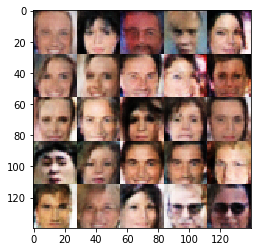

Epoch 0/1... Discriminator Loss: 1.5231... Generator Loss: 0.3300
Epoch 0/1... Discriminator Loss: 0.9278... Generator Loss: 0.6958
Epoch 0/1... Discriminator Loss: 0.4665... Generator Loss: 1.4089
Epoch 0/1... Discriminator Loss: 0.6373... Generator Loss: 1.0248
Epoch 0/1... Discriminator Loss: 0.9185... Generator Loss: 1.0984
Epoch 0/1... Discriminator Loss: 0.7745... Generator Loss: 1.1933
Epoch 0/1... Discriminator Loss: 0.3632... Generator Loss: 1.8020
Epoch 0/1... Discriminator Loss: 0.8512... Generator Loss: 0.7390
Epoch 0/1... Discriminator Loss: 0.9454... Generator Loss: 1.4843
Epoch 0/1... Discriminator Loss: 1.8164... Generator Loss: 0.2184


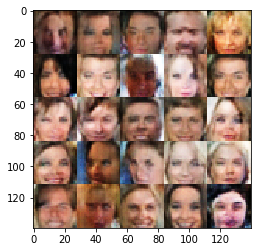

Epoch 0/1... Discriminator Loss: 0.5883... Generator Loss: 1.4639
Epoch 0/1... Discriminator Loss: 1.2184... Generator Loss: 0.5182
Epoch 0/1... Discriminator Loss: 1.0698... Generator Loss: 0.5743
Epoch 0/1... Discriminator Loss: 1.3792... Generator Loss: 0.4780
Epoch 0/1... Discriminator Loss: 0.7453... Generator Loss: 0.7943
Epoch 0/1... Discriminator Loss: 0.5984... Generator Loss: 1.2826
Epoch 0/1... Discriminator Loss: 1.1712... Generator Loss: 1.1390
Epoch 0/1... Discriminator Loss: 0.9420... Generator Loss: 0.7758
Epoch 0/1... Discriminator Loss: 0.7891... Generator Loss: 0.8986
Epoch 0/1... Discriminator Loss: 0.5070... Generator Loss: 1.3212


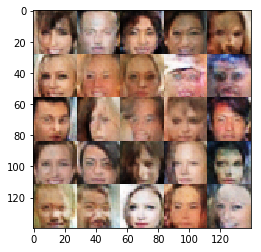

Epoch 0/1... Discriminator Loss: 0.7243... Generator Loss: 1.1440
Epoch 0/1... Discriminator Loss: 0.6643... Generator Loss: 1.2886
Epoch 0/1... Discriminator Loss: 1.1025... Generator Loss: 0.6279
Epoch 0/1... Discriminator Loss: 0.7864... Generator Loss: 1.2404
Epoch 0/1... Discriminator Loss: 0.4979... Generator Loss: 1.5317
Epoch 0/1... Discriminator Loss: 0.5146... Generator Loss: 1.7174
Epoch 0/1... Discriminator Loss: 0.9416... Generator Loss: 1.9103
Epoch 0/1... Discriminator Loss: 0.7064... Generator Loss: 1.0670
Epoch 0/1... Discriminator Loss: 1.0336... Generator Loss: 0.5795
Epoch 0/1... Discriminator Loss: 0.5514... Generator Loss: 1.2847


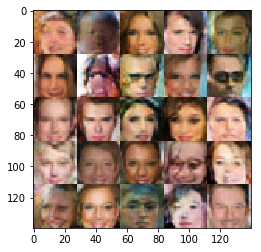

Epoch 0/1... Discriminator Loss: 1.0254... Generator Loss: 0.8270
Epoch 0/1... Discriminator Loss: 0.9265... Generator Loss: 0.8397
Epoch 0/1... Discriminator Loss: 1.7583... Generator Loss: 0.2394
Epoch 0/1... Discriminator Loss: 0.5474... Generator Loss: 1.5510
Epoch 0/1... Discriminator Loss: 0.5039... Generator Loss: 1.4432
Epoch 0/1... Discriminator Loss: 0.6914... Generator Loss: 1.1385
Epoch 0/1... Discriminator Loss: 0.7176... Generator Loss: 1.1409
Epoch 0/1... Discriminator Loss: 0.6367... Generator Loss: 1.3687
Epoch 0/1... Discriminator Loss: 0.9098... Generator Loss: 0.8563
Epoch 0/1... Discriminator Loss: 0.6222... Generator Loss: 1.7995


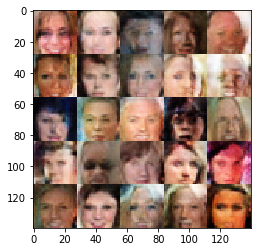

Epoch 0/1... Discriminator Loss: 0.6526... Generator Loss: 0.9871
Epoch 0/1... Discriminator Loss: 1.4070... Generator Loss: 0.3751
Epoch 0/1... Discriminator Loss: 0.7387... Generator Loss: 1.2013
Epoch 0/1... Discriminator Loss: 1.0402... Generator Loss: 0.7866
Epoch 0/1... Discriminator Loss: 0.6484... Generator Loss: 1.1007
Epoch 0/1... Discriminator Loss: 0.6675... Generator Loss: 1.2737
Epoch 0/1... Discriminator Loss: 0.4173... Generator Loss: 1.2852
Epoch 0/1... Discriminator Loss: 0.6897... Generator Loss: 0.9657
Epoch 0/1... Discriminator Loss: 1.3577... Generator Loss: 0.3986
Epoch 0/1... Discriminator Loss: 0.8905... Generator Loss: 0.7455


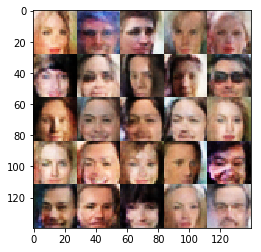

Epoch 0/1... Discriminator Loss: 0.7452... Generator Loss: 1.3517
Epoch 0/1... Discriminator Loss: 1.0520... Generator Loss: 0.5660
Epoch 0/1... Discriminator Loss: 0.6084... Generator Loss: 1.5320
Epoch 0/1... Discriminator Loss: 0.7261... Generator Loss: 2.0970
Epoch 0/1... Discriminator Loss: 0.9286... Generator Loss: 0.8400
Epoch 0/1... Discriminator Loss: 0.6993... Generator Loss: 0.8324
Epoch 0/1... Discriminator Loss: 1.0160... Generator Loss: 0.6118
Epoch 0/1... Discriminator Loss: 1.1231... Generator Loss: 0.6373
Epoch 0/1... Discriminator Loss: 0.9735... Generator Loss: 0.6203
Epoch 0/1... Discriminator Loss: 0.5570... Generator Loss: 1.2528


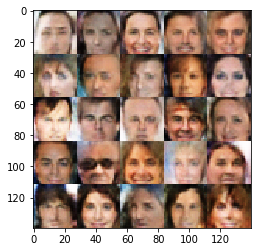

Epoch 0/1... Discriminator Loss: 0.8309... Generator Loss: 0.9493
Epoch 0/1... Discriminator Loss: 0.6113... Generator Loss: 1.5472
Epoch 0/1... Discriminator Loss: 0.9281... Generator Loss: 2.1478
Epoch 0/1... Discriminator Loss: 1.1255... Generator Loss: 0.5460
Epoch 0/1... Discriminator Loss: 1.0681... Generator Loss: 0.7984
Epoch 0/1... Discriminator Loss: 0.3288... Generator Loss: 2.2625
Epoch 0/1... Discriminator Loss: 1.1168... Generator Loss: 0.6262
Epoch 0/1... Discriminator Loss: 0.6608... Generator Loss: 1.0755
Epoch 0/1... Discriminator Loss: 0.3533... Generator Loss: 2.0006
Epoch 0/1... Discriminator Loss: 0.5657... Generator Loss: 1.8467


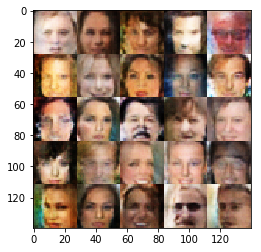

Epoch 0/1... Discriminator Loss: 0.6303... Generator Loss: 1.1326
Epoch 0/1... Discriminator Loss: 0.9274... Generator Loss: 0.8485
Epoch 0/1... Discriminator Loss: 0.6640... Generator Loss: 0.9567
Epoch 0/1... Discriminator Loss: 1.0603... Generator Loss: 0.5616
Epoch 0/1... Discriminator Loss: 0.7582... Generator Loss: 0.9452
Epoch 0/1... Discriminator Loss: 0.6686... Generator Loss: 2.2492
Epoch 0/1... Discriminator Loss: 0.6434... Generator Loss: 1.4090
Epoch 0/1... Discriminator Loss: 0.5820... Generator Loss: 1.3785
Epoch 0/1... Discriminator Loss: 1.0045... Generator Loss: 0.7160
Epoch 0/1... Discriminator Loss: 1.4676... Generator Loss: 0.3788


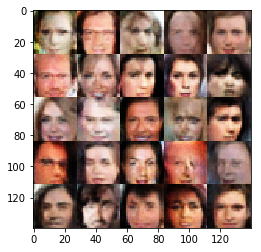

Epoch 0/1... Discriminator Loss: 0.5914... Generator Loss: 1.6064
Epoch 0/1... Discriminator Loss: 1.4286... Generator Loss: 0.7375
Epoch 0/1... Discriminator Loss: 1.2854... Generator Loss: 0.4733
Epoch 0/1... Discriminator Loss: 0.5505... Generator Loss: 1.7525
Epoch 0/1... Discriminator Loss: 0.8064... Generator Loss: 1.3182
Epoch 0/1... Discriminator Loss: 0.5201... Generator Loss: 1.4538
Epoch 0/1... Discriminator Loss: 0.9210... Generator Loss: 1.3351
Epoch 0/1... Discriminator Loss: 0.9221... Generator Loss: 0.7469
Epoch 0/1... Discriminator Loss: 0.8038... Generator Loss: 0.9330
Epoch 0/1... Discriminator Loss: 0.7501... Generator Loss: 1.1871


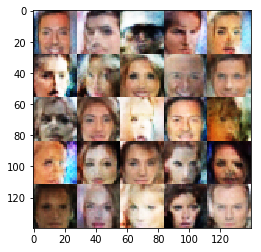

Epoch 0/1... Discriminator Loss: 0.9549... Generator Loss: 0.7746
Epoch 0/1... Discriminator Loss: 1.0635... Generator Loss: 0.6115
Epoch 0/1... Discriminator Loss: 0.5637... Generator Loss: 1.3711
Epoch 0/1... Discriminator Loss: 0.8131... Generator Loss: 0.7800
Epoch 0/1... Discriminator Loss: 0.6562... Generator Loss: 1.1290
Epoch 0/1... Discriminator Loss: 0.9218... Generator Loss: 0.7299
Epoch 0/1... Discriminator Loss: 0.4054... Generator Loss: 1.3195
Epoch 0/1... Discriminator Loss: 0.3907... Generator Loss: 1.5439
Epoch 0/1... Discriminator Loss: 0.9993... Generator Loss: 0.7260
Epoch 0/1... Discriminator Loss: 0.8626... Generator Loss: 0.7024


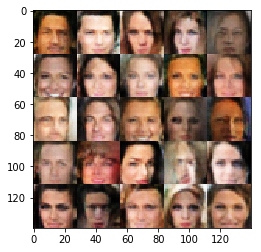

Epoch 0/1... Discriminator Loss: 1.2302... Generator Loss: 0.5543
Epoch 0/1... Discriminator Loss: 0.6730... Generator Loss: 1.1901
Epoch 0/1... Discriminator Loss: 0.9937... Generator Loss: 0.6273
Epoch 0/1... Discriminator Loss: 0.7349... Generator Loss: 1.1105
Epoch 0/1... Discriminator Loss: 0.4787... Generator Loss: 1.5657
Epoch 0/1... Discriminator Loss: 1.2204... Generator Loss: 0.4579
Epoch 0/1... Discriminator Loss: 1.2760... Generator Loss: 0.4228
Epoch 0/1... Discriminator Loss: 0.9559... Generator Loss: 0.7125
Epoch 0/1... Discriminator Loss: 0.5586... Generator Loss: 1.4201
Epoch 0/1... Discriminator Loss: 0.3439... Generator Loss: 1.7785


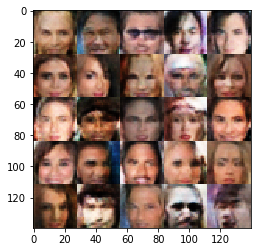

Epoch 0/1... Discriminator Loss: 0.7850... Generator Loss: 1.1409
Epoch 0/1... Discriminator Loss: 1.4419... Generator Loss: 0.3930
Epoch 0/1... Discriminator Loss: 0.4273... Generator Loss: 1.6215
Epoch 0/1... Discriminator Loss: 0.8294... Generator Loss: 0.9026
Epoch 0/1... Discriminator Loss: 0.7016... Generator Loss: 0.8716
Epoch 0/1... Discriminator Loss: 0.5183... Generator Loss: 1.5351
Epoch 0/1... Discriminator Loss: 1.0981... Generator Loss: 0.8786
Epoch 0/1... Discriminator Loss: 0.8161... Generator Loss: 1.0521
Epoch 0/1... Discriminator Loss: 1.0528... Generator Loss: 0.7366
Epoch 0/1... Discriminator Loss: 0.8638... Generator Loss: 1.7284


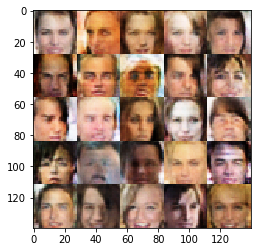

Epoch 0/1... Discriminator Loss: 1.1721... Generator Loss: 0.5148
Epoch 0/1... Discriminator Loss: 1.1964... Generator Loss: 0.5536
Epoch 0/1... Discriminator Loss: 0.7992... Generator Loss: 0.9987
Epoch 0/1... Discriminator Loss: 1.3214... Generator Loss: 0.4304
Epoch 0/1... Discriminator Loss: 0.9087... Generator Loss: 0.7965
Epoch 0/1... Discriminator Loss: 1.2951... Generator Loss: 0.4643
Epoch 0/1... Discriminator Loss: 0.3854... Generator Loss: 2.1540
Epoch 0/1... Discriminator Loss: 0.9771... Generator Loss: 0.8721
Epoch 0/1... Discriminator Loss: 1.4807... Generator Loss: 0.5846
Epoch 0/1... Discriminator Loss: 0.9972... Generator Loss: 0.6137


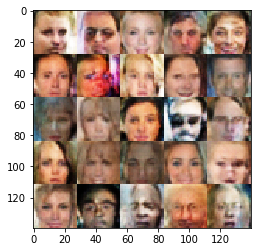

Epoch 0/1... Discriminator Loss: 0.7628... Generator Loss: 0.9606
Epoch 0/1... Discriminator Loss: 0.6023... Generator Loss: 1.4021
Epoch 0/1... Discriminator Loss: 0.6046... Generator Loss: 1.0653
Epoch 0/1... Discriminator Loss: 0.9570... Generator Loss: 0.7153
Epoch 0/1... Discriminator Loss: 0.7766... Generator Loss: 1.4427
Epoch 0/1... Discriminator Loss: 0.9767... Generator Loss: 0.6627
Epoch 0/1... Discriminator Loss: 0.6101... Generator Loss: 1.7509
Epoch 0/1... Discriminator Loss: 0.8134... Generator Loss: 0.8992
Epoch 0/1... Discriminator Loss: 0.8408... Generator Loss: 0.7078
Epoch 0/1... Discriminator Loss: 0.6264... Generator Loss: 1.1955


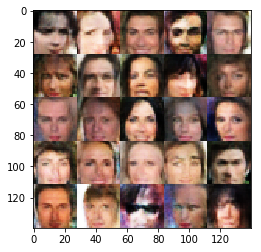

Epoch 0/1... Discriminator Loss: 0.9952... Generator Loss: 0.8277
Epoch 0/1... Discriminator Loss: 0.9501... Generator Loss: 1.2072
Epoch 0/1... Discriminator Loss: 0.9695... Generator Loss: 0.8455
Epoch 0/1... Discriminator Loss: 0.7478... Generator Loss: 0.9229
Epoch 0/1... Discriminator Loss: 0.4993... Generator Loss: 1.2191
Epoch 0/1... Discriminator Loss: 0.6817... Generator Loss: 1.0308
Epoch 0/1... Discriminator Loss: 0.9835... Generator Loss: 0.8190
Epoch 0/1... Discriminator Loss: 1.5109... Generator Loss: 0.3596
Epoch 0/1... Discriminator Loss: 0.8891... Generator Loss: 0.6292
Epoch 0/1... Discriminator Loss: 1.7626... Generator Loss: 0.2292


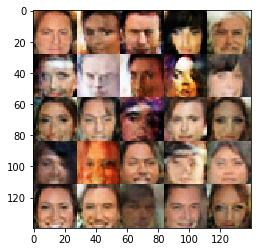

Epoch 0/1... Discriminator Loss: 0.9074... Generator Loss: 1.1308
Epoch 0/1... Discriminator Loss: 0.7163... Generator Loss: 0.9707
Epoch 0/1... Discriminator Loss: 0.6014... Generator Loss: 1.5388
Epoch 0/1... Discriminator Loss: 1.0749... Generator Loss: 0.5797
Epoch 0/1... Discriminator Loss: 0.5177... Generator Loss: 1.4216
Epoch 0/1... Discriminator Loss: 1.0749... Generator Loss: 0.6895
Epoch 0/1... Discriminator Loss: 0.6244... Generator Loss: 1.5249
Epoch 0/1... Discriminator Loss: 0.7797... Generator Loss: 0.9887
Epoch 0/1... Discriminator Loss: 1.2306... Generator Loss: 0.4580
Epoch 0/1... Discriminator Loss: 0.8583... Generator Loss: 0.6796


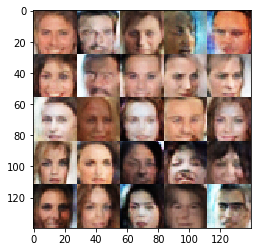

Epoch 0/1... Discriminator Loss: 0.8928... Generator Loss: 0.7010
Epoch 0/1... Discriminator Loss: 0.9105... Generator Loss: 1.1624
Epoch 0/1... Discriminator Loss: 0.7552... Generator Loss: 1.0337
Epoch 0/1... Discriminator Loss: 0.5695... Generator Loss: 1.2221
Epoch 0/1... Discriminator Loss: 0.8542... Generator Loss: 0.8326
Epoch 0/1... Discriminator Loss: 0.7434... Generator Loss: 0.9973
Epoch 0/1... Discriminator Loss: 0.6816... Generator Loss: 0.9242
Epoch 0/1... Discriminator Loss: 0.9515... Generator Loss: 0.7550
Epoch 0/1... Discriminator Loss: 0.5611... Generator Loss: 1.6540
Epoch 0/1... Discriminator Loss: 0.5261... Generator Loss: 1.2532


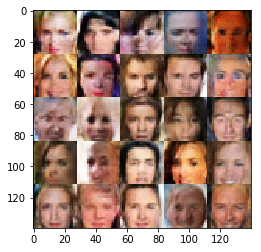

Epoch 0/1... Discriminator Loss: 1.1342... Generator Loss: 0.6686
Epoch 0/1... Discriminator Loss: 1.2645... Generator Loss: 1.5437
Epoch 0/1... Discriminator Loss: 0.6571... Generator Loss: 1.1086
Epoch 0/1... Discriminator Loss: 0.7002... Generator Loss: 0.8708
Epoch 0/1... Discriminator Loss: 0.9206... Generator Loss: 0.7030
Epoch 0/1... Discriminator Loss: 0.7001... Generator Loss: 1.1178
Epoch 0/1... Discriminator Loss: 0.7619... Generator Loss: 0.9841
Epoch 0/1... Discriminator Loss: 0.9130... Generator Loss: 0.6764
Epoch 0/1... Discriminator Loss: 0.7984... Generator Loss: 0.9239
Epoch 0/1... Discriminator Loss: 1.0590... Generator Loss: 0.5610


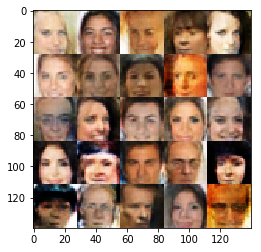

Epoch 0/1... Discriminator Loss: 0.9752... Generator Loss: 0.6212
Epoch 0/1... Discriminator Loss: 1.2373... Generator Loss: 0.4597
Epoch 0/1... Discriminator Loss: 0.7265... Generator Loss: 1.2061
Epoch 0/1... Discriminator Loss: 0.7603... Generator Loss: 0.9705
Epoch 0/1... Discriminator Loss: 1.0095... Generator Loss: 1.3153
Epoch 0/1... Discriminator Loss: 0.4875... Generator Loss: 1.7566
Epoch 0/1... Discriminator Loss: 0.4831... Generator Loss: 1.8525
Epoch 0/1... Discriminator Loss: 0.7866... Generator Loss: 0.7827
Epoch 0/1... Discriminator Loss: 0.7281... Generator Loss: 1.0319
Epoch 0/1... Discriminator Loss: 0.6671... Generator Loss: 0.9967


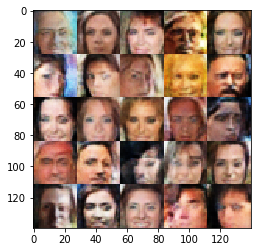

Epoch 0/1... Discriminator Loss: 0.3443... Generator Loss: 2.0389
Epoch 0/1... Discriminator Loss: 0.4149... Generator Loss: 1.6808
Epoch 0/1... Discriminator Loss: 0.9947... Generator Loss: 0.6225
Epoch 0/1... Discriminator Loss: 0.6690... Generator Loss: 1.3862
Epoch 0/1... Discriminator Loss: 1.1054... Generator Loss: 1.0040
Epoch 0/1... Discriminator Loss: 1.2949... Generator Loss: 0.5777
Epoch 0/1... Discriminator Loss: 0.8142... Generator Loss: 0.9186
Epoch 0/1... Discriminator Loss: 0.7259... Generator Loss: 1.7090
Epoch 0/1... Discriminator Loss: 0.8212... Generator Loss: 1.0890
Epoch 0/1... Discriminator Loss: 0.8324... Generator Loss: 0.9646


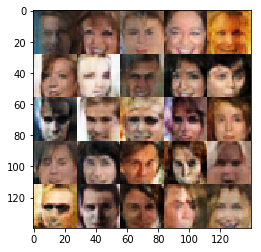

Epoch 0/1... Discriminator Loss: 0.7644... Generator Loss: 0.8575
Epoch 0/1... Discriminator Loss: 0.5152... Generator Loss: 1.6059
Epoch 0/1... Discriminator Loss: 1.0856... Generator Loss: 0.5637
Epoch 0/1... Discriminator Loss: 0.8133... Generator Loss: 0.8352
Epoch 0/1... Discriminator Loss: 0.9142... Generator Loss: 0.7928
Epoch 0/1... Discriminator Loss: 0.7585... Generator Loss: 0.9280
Epoch 0/1... Discriminator Loss: 1.0408... Generator Loss: 0.6609
Epoch 0/1... Discriminator Loss: 0.5439... Generator Loss: 1.3172
Epoch 0/1... Discriminator Loss: 0.9006... Generator Loss: 0.7206
Epoch 0/1... Discriminator Loss: 0.4625... Generator Loss: 1.5758


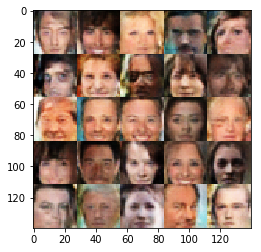

Epoch 0/1... Discriminator Loss: 0.8497... Generator Loss: 0.7925
Epoch 0/1... Discriminator Loss: 1.2818... Generator Loss: 0.5086
Epoch 0/1... Discriminator Loss: 0.6861... Generator Loss: 1.3129
Epoch 0/1... Discriminator Loss: 0.8278... Generator Loss: 1.7046
Epoch 0/1... Discriminator Loss: 0.3348... Generator Loss: 2.0402
Epoch 0/1... Discriminator Loss: 0.5812... Generator Loss: 1.5603
Epoch 0/1... Discriminator Loss: 0.6252... Generator Loss: 1.1495
Epoch 0/1... Discriminator Loss: 0.4573... Generator Loss: 1.3793
Epoch 0/1... Discriminator Loss: 0.7007... Generator Loss: 1.0270
Epoch 0/1... Discriminator Loss: 0.4242... Generator Loss: 1.6258


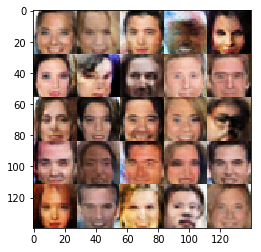

Epoch 0/1... Discriminator Loss: 0.8406... Generator Loss: 0.9160
Epoch 0/1... Discriminator Loss: 1.0937... Generator Loss: 0.7276
Epoch 0/1... Discriminator Loss: 1.3865... Generator Loss: 0.3701
Epoch 0/1... Discriminator Loss: 0.5486... Generator Loss: 1.4269
Epoch 0/1... Discriminator Loss: 0.8969... Generator Loss: 0.7547
Epoch 0/1... Discriminator Loss: 0.9249... Generator Loss: 0.7444
Epoch 0/1... Discriminator Loss: 0.8396... Generator Loss: 0.7607
Epoch 0/1... Discriminator Loss: 0.6258... Generator Loss: 1.2014
Epoch 0/1... Discriminator Loss: 0.7205... Generator Loss: 0.9028
Epoch 0/1... Discriminator Loss: 1.3080... Generator Loss: 0.4012


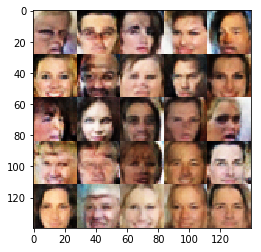

Epoch 0/1... Discriminator Loss: 0.6033... Generator Loss: 1.5112
Epoch 0/1... Discriminator Loss: 0.7641... Generator Loss: 1.0503
Epoch 0/1... Discriminator Loss: 0.4795... Generator Loss: 1.7344
Epoch 0/1... Discriminator Loss: 1.5644... Generator Loss: 0.2960
Epoch 0/1... Discriminator Loss: 0.8580... Generator Loss: 1.1349
Epoch 0/1... Discriminator Loss: 1.0326... Generator Loss: 0.6111
Epoch 0/1... Discriminator Loss: 0.5429... Generator Loss: 1.5174
Epoch 0/1... Discriminator Loss: 0.7142... Generator Loss: 1.1424
Epoch 0/1... Discriminator Loss: 0.8820... Generator Loss: 0.7227
Epoch 0/1... Discriminator Loss: 0.4556... Generator Loss: 1.6745


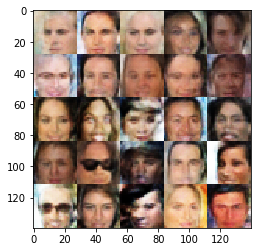

Epoch 0/1... Discriminator Loss: 0.7402... Generator Loss: 1.3779
Epoch 0/1... Discriminator Loss: 0.6604... Generator Loss: 1.3237
Epoch 0/1... Discriminator Loss: 0.9122... Generator Loss: 0.9392
Epoch 0/1... Discriminator Loss: 0.4611... Generator Loss: 1.8606
Epoch 0/1... Discriminator Loss: 0.3262... Generator Loss: 1.8861
Epoch 0/1... Discriminator Loss: 0.8870... Generator Loss: 1.5447
Epoch 0/1... Discriminator Loss: 1.0110... Generator Loss: 0.6447
Epoch 0/1... Discriminator Loss: 0.8101... Generator Loss: 1.2585
Epoch 0/1... Discriminator Loss: 0.8476... Generator Loss: 0.7789
Epoch 0/1... Discriminator Loss: 1.2278... Generator Loss: 1.8920


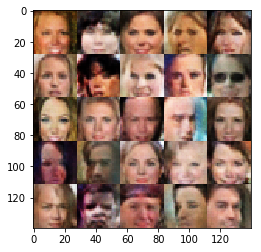

Epoch 0/1... Discriminator Loss: 1.0822... Generator Loss: 0.6704
Epoch 0/1... Discriminator Loss: 1.2606... Generator Loss: 0.5828
Epoch 0/1... Discriminator Loss: 0.4497... Generator Loss: 1.8941
Epoch 0/1... Discriminator Loss: 0.9108... Generator Loss: 0.9221
Epoch 0/1... Discriminator Loss: 1.0203... Generator Loss: 0.6995
Epoch 0/1... Discriminator Loss: 0.8110... Generator Loss: 1.0528
Epoch 0/1... Discriminator Loss: 0.8281... Generator Loss: 0.8001
Epoch 0/1... Discriminator Loss: 0.5609... Generator Loss: 1.3954
Epoch 0/1... Discriminator Loss: 0.5466... Generator Loss: 1.1344
Epoch 0/1... Discriminator Loss: 0.9366... Generator Loss: 0.8895


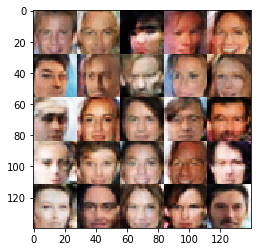

Epoch 0/1... Discriminator Loss: 0.9468... Generator Loss: 0.6172
Epoch 0/1... Discriminator Loss: 0.6638... Generator Loss: 1.3879
Epoch 0/1... Discriminator Loss: 0.7918... Generator Loss: 0.7513
Epoch 0/1... Discriminator Loss: 1.1784... Generator Loss: 0.4832
Epoch 0/1... Discriminator Loss: 0.8773... Generator Loss: 1.0155
Epoch 0/1... Discriminator Loss: 0.2729... Generator Loss: 2.0966
Epoch 0/1... Discriminator Loss: 0.8075... Generator Loss: 1.7035
Epoch 0/1... Discriminator Loss: 1.0239... Generator Loss: 0.6625
Epoch 0/1... Discriminator Loss: 1.4902... Generator Loss: 0.3587
Epoch 0/1... Discriminator Loss: 0.5276... Generator Loss: 1.3772


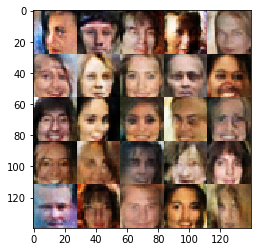

Epoch 0/1... Discriminator Loss: 0.6474... Generator Loss: 1.1350
Epoch 0/1... Discriminator Loss: 1.2582... Generator Loss: 0.7360
Epoch 0/1... Discriminator Loss: 0.6389... Generator Loss: 1.1336
Epoch 0/1... Discriminator Loss: 0.8579... Generator Loss: 0.8412
Epoch 0/1... Discriminator Loss: 0.6354... Generator Loss: 1.1339
Epoch 0/1... Discriminator Loss: 0.5715... Generator Loss: 1.1851
Epoch 0/1... Discriminator Loss: 1.0155... Generator Loss: 0.5662
Epoch 0/1... Discriminator Loss: 1.3350... Generator Loss: 0.4109
Epoch 0/1... Discriminator Loss: 0.7541... Generator Loss: 0.8925
Epoch 0/1... Discriminator Loss: 0.4708... Generator Loss: 1.3862


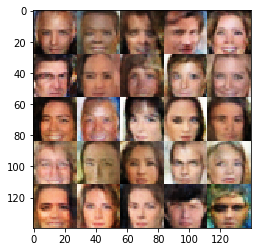

Epoch 0/1... Discriminator Loss: 1.1486... Generator Loss: 0.7533
Epoch 0/1... Discriminator Loss: 0.7384... Generator Loss: 0.9813
Epoch 0/1... Discriminator Loss: 0.7276... Generator Loss: 1.4764
Epoch 0/1... Discriminator Loss: 1.3120... Generator Loss: 0.6546
Epoch 0/1... Discriminator Loss: 0.8559... Generator Loss: 0.9359
Epoch 0/1... Discriminator Loss: 1.3977... Generator Loss: 0.3910
Epoch 0/1... Discriminator Loss: 0.8338... Generator Loss: 1.0018
Epoch 0/1... Discriminator Loss: 0.6766... Generator Loss: 1.0962
Epoch 0/1... Discriminator Loss: 0.9234... Generator Loss: 0.6831
Epoch 0/1... Discriminator Loss: 0.5729... Generator Loss: 1.4388


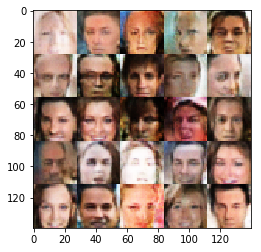

Epoch 0/1... Discriminator Loss: 0.8834... Generator Loss: 0.8518
Epoch 0/1... Discriminator Loss: 0.9344... Generator Loss: 0.7012
Epoch 0/1... Discriminator Loss: 0.5322... Generator Loss: 1.8745
Epoch 0/1... Discriminator Loss: 0.5330... Generator Loss: 1.1746
Epoch 0/1... Discriminator Loss: 0.5831... Generator Loss: 1.0539
Epoch 0/1... Discriminator Loss: 0.5140... Generator Loss: 1.4054
Epoch 0/1... Discriminator Loss: 0.3804... Generator Loss: 1.8467
Epoch 0/1... Discriminator Loss: 0.9351... Generator Loss: 0.7818
Epoch 0/1... Discriminator Loss: 0.7171... Generator Loss: 1.1092
Epoch 0/1... Discriminator Loss: 0.8354... Generator Loss: 0.8825


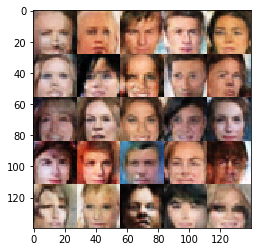

Epoch 0/1... Discriminator Loss: 0.8512... Generator Loss: 0.8306
Epoch 0/1... Discriminator Loss: 0.5687... Generator Loss: 1.6545
Epoch 0/1... Discriminator Loss: 0.8347... Generator Loss: 0.7430
Epoch 0/1... Discriminator Loss: 0.3949... Generator Loss: 1.4308
Epoch 0/1... Discriminator Loss: 0.8138... Generator Loss: 1.2600
Epoch 0/1... Discriminator Loss: 0.7660... Generator Loss: 0.9283
Epoch 0/1... Discriminator Loss: 1.2966... Generator Loss: 0.4906
Epoch 0/1... Discriminator Loss: 1.1830... Generator Loss: 0.4575
Epoch 0/1... Discriminator Loss: 0.9847... Generator Loss: 0.8898
Epoch 0/1... Discriminator Loss: 0.9954... Generator Loss: 0.6898


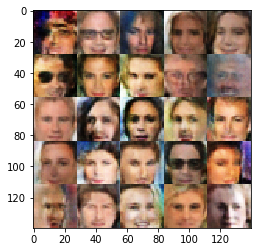

Epoch 0/1... Discriminator Loss: 0.5206... Generator Loss: 1.5994
Epoch 0/1... Discriminator Loss: 1.0887... Generator Loss: 0.5142
Epoch 0/1... Discriminator Loss: 0.4515... Generator Loss: 1.9435
Epoch 0/1... Discriminator Loss: 0.6165... Generator Loss: 1.0210
Epoch 0/1... Discriminator Loss: 0.9388... Generator Loss: 1.4661
Epoch 0/1... Discriminator Loss: 1.1264... Generator Loss: 0.6463
Epoch 0/1... Discriminator Loss: 0.8088... Generator Loss: 0.9355
Epoch 0/1... Discriminator Loss: 0.8695... Generator Loss: 0.7768
Epoch 0/1... Discriminator Loss: 0.8078... Generator Loss: 0.8039
Epoch 0/1... Discriminator Loss: 1.0858... Generator Loss: 0.7510


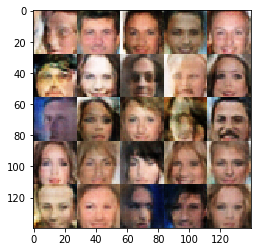

Epoch 0/1... Discriminator Loss: 0.4566... Generator Loss: 1.7310
Epoch 0/1... Discriminator Loss: 1.1107... Generator Loss: 0.6133
Epoch 0/1... Discriminator Loss: 1.0657... Generator Loss: 0.6777
Epoch 0/1... Discriminator Loss: 1.0626... Generator Loss: 0.5304
Epoch 0/1... Discriminator Loss: 1.3048... Generator Loss: 0.5079
Epoch 0/1... Discriminator Loss: 1.0705... Generator Loss: 0.6009
Epoch 0/1... Discriminator Loss: 0.9917... Generator Loss: 0.7867
Epoch 0/1... Discriminator Loss: 0.5347... Generator Loss: 1.3205
Epoch 0/1... Discriminator Loss: 1.1766... Generator Loss: 0.4736
Epoch 0/1... Discriminator Loss: 1.2282... Generator Loss: 0.6409


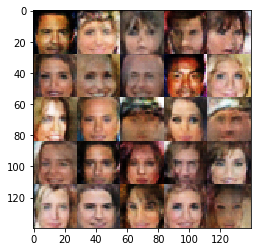

Epoch 0/1... Discriminator Loss: 0.6382... Generator Loss: 1.1437
Epoch 0/1... Discriminator Loss: 1.3495... Generator Loss: 0.4313
Epoch 0/1... Discriminator Loss: 0.7688... Generator Loss: 0.8606
Epoch 0/1... Discriminator Loss: 0.7251... Generator Loss: 1.1095
Epoch 0/1... Discriminator Loss: 1.0048... Generator Loss: 0.6652
Epoch 0/1... Discriminator Loss: 0.8498... Generator Loss: 0.7870
Epoch 0/1... Discriminator Loss: 0.7042... Generator Loss: 1.0811
Epoch 0/1... Discriminator Loss: 0.9604... Generator Loss: 0.6707
Epoch 0/1... Discriminator Loss: 0.9544... Generator Loss: 0.7274
Epoch 0/1... Discriminator Loss: 0.7549... Generator Loss: 0.9123


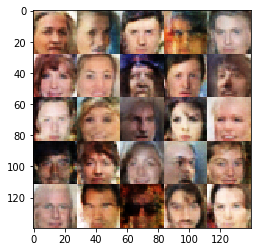

Epoch 0/1... Discriminator Loss: 0.7434... Generator Loss: 0.8906
Epoch 0/1... Discriminator Loss: 0.9561... Generator Loss: 0.7670
Epoch 0/1... Discriminator Loss: 0.8064... Generator Loss: 0.7704
Epoch 0/1... Discriminator Loss: 1.1193... Generator Loss: 0.7866
Epoch 0/1... Discriminator Loss: 1.4011... Generator Loss: 0.3683
Epoch 0/1... Discriminator Loss: 0.9646... Generator Loss: 0.7064
Epoch 0/1... Discriminator Loss: 0.7162... Generator Loss: 0.9733
Epoch 0/1... Discriminator Loss: 0.5987... Generator Loss: 1.4365
Epoch 0/1... Discriminator Loss: 0.6618... Generator Loss: 0.9489
Epoch 0/1... Discriminator Loss: 0.7370... Generator Loss: 0.8991


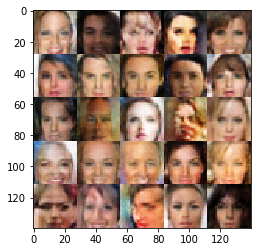

Epoch 0/1... Discriminator Loss: 0.7107... Generator Loss: 1.1112
Epoch 0/1... Discriminator Loss: 0.9025... Generator Loss: 0.7369
Epoch 0/1... Discriminator Loss: 0.8570... Generator Loss: 1.0526
Epoch 0/1... Discriminator Loss: 0.8871... Generator Loss: 0.8877
Epoch 0/1... Discriminator Loss: 1.1206... Generator Loss: 0.6331
Epoch 0/1... Discriminator Loss: 1.0106... Generator Loss: 0.7335
Epoch 0/1... Discriminator Loss: 0.9319... Generator Loss: 1.1406
Epoch 0/1... Discriminator Loss: 0.5636... Generator Loss: 1.2147
Epoch 0/1... Discriminator Loss: 0.8690... Generator Loss: 1.0623
Epoch 0/1... Discriminator Loss: 0.7357... Generator Loss: 1.1025


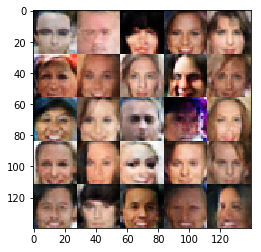

Epoch 0/1... Discriminator Loss: 0.6154... Generator Loss: 1.2215
Epoch 0/1... Discriminator Loss: 0.6438... Generator Loss: 1.2488
Epoch 0/1... Discriminator Loss: 0.7174... Generator Loss: 1.0904
Epoch 0/1... Discriminator Loss: 0.7625... Generator Loss: 1.5656
Epoch 0/1... Discriminator Loss: 0.9450... Generator Loss: 0.7315
Epoch 0/1... Discriminator Loss: 0.5900... Generator Loss: 1.8662


In [13]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。